## Libraries

In [9]:
import snntorch as snn
from snntorch import surrogate
from copy import deepcopy
import matplotlib.pyplot as plt
import numpy as np
import torch
from typing import Callable

In [7]:
import visualize
import dataset as ds
import SNN_func as snnfn

In [8]:
from matplotlib.colors import SymLogNorm
import imageio
import os

## Constants

In [10]:
nCublets = 1000
nSensors = 100 # in the upper layer of the primary cubelet
max_t = 20
dt = 0.2
timesteps = int(max_t/dt)

In [11]:
labels_map = {
  -1: "unclassified",
   0: "proton",
   1: "kaon",
   2: "pion",
   3: "other"
}
nClasses = len(labels_map)-1

## Network Parameters

### Architecture

In [12]:
# Network Descriptions

population = 20

net_desc = {
    "layers" : [400, 120, 120, population],
    "timesteps": 100,
    "neuron_params" : {
                1: [snn.Leaky, 
                    {"beta" : 1.0,
                    "learn_beta": True,
                    "threshold" : 1.0,
                    "learn_threshold": True,
                    "spike_grad": surrogate.atan(),
                    }],
                2: [snn.Leaky, 
                    {"beta" : 1.0,
                    "learn_beta": True,
                    "threshold" : 1.0,
                    "learn_threshold": True,
                    "spike_grad": surrogate.atan(),
                    }],
                3: [snn.Leaky, 
                    {"beta" : 1.0,
                    "learn_beta": True,
                    "threshold" : 1.0,
                    "learn_threshold": True, 
                    "spike_grad": surrogate.atan(),
                    }]
                }
    }

# Output layer choice

#net_desc_membrane = deepcopy(net_desc)
#net_desc_membrane["output"] = "membrane"

net_desc_spikefreq = deepcopy(net_desc)
net_desc_spikefreq["output"] = "spike"

### Spike Generation

In [13]:
# Spike Generation

# old spikegen function
def _spikegen(data):
    spike_data = data.transpose(0,1) 
    spike_train = torch.where(spike_data > 300, torch.tensor(1), torch.tensor(0)).to(torch.float32) 
    return spike_train

def spikegen_multi(data, multiplicity=4):
    og_shape = data.shape
    spike_data = torch.zeros(og_shape[1], og_shape[0], multiplicity*og_shape[2])
    for i in range(multiplicity):
        condition = data > np.power(10, i+2)
        batch_idx, time_idx, sensor_idx = torch.nonzero(condition, as_tuple=True)
        spike_data[time_idx, batch_idx, multiplicity*sensor_idx+i] = 1

    return spike_data

### Prediction

In [14]:
def predict_membrane(output):
    prediction = output[-1].squeeze(1)
    if len(prediction.shape) > 1:
        prediction = prediction.mean(1)
    return prediction

def predict_spikefreq(output):
    prediction = output.sum(0).mean(1) # sum spikes across time and average over the population
    return prediction

def distance(prediction, targets, absolute: bool = True, relative: bool = True,
             transform: Callable = lambda *args, **kwargs: args[0]):
    p, t = transform(prediction), transform(targets)
    accuracy = t - p
    if absolute:
        accuracy = torch.abs(accuracy)
    if relative:
        accuracy /= t
    return accuracy

def antitransform(x):
    a = x.clone() 
    a[:, 0] = torch.pow(10, a[:,0])
    return a

# Dataset Creation

Change the path depending on which dataset you want to use.

In [15]:
dataset = ds.build_dataset("../DataThesis/uniform/5r_mufix_uni/mufix_uni_1000e", max_files=100, primary_only=True,
                           target=["energy","centroid","dispersion"])

In [16]:
print(len(dataset))

14942


In [1]:
# DON'T RUN THIS CELL -> KERNEL CRASH 
dataset_std = ds.build_dataset("../Data/PrimaryOnly/Uniform", max_files=100, primary_only=True,
                           target=["energy","centroid","dispersion"])

NameError: name 'ds' is not defined

In [12]:
print(len(dataset_std))

NameError: name 'dataset_std' is not defined

### A bit of data for prof!
Produce a CSV file in the format `x y t N` where:
- $x,y\in[0,99]$ representing grid position, 
- $t\in[0,99]$ representing timestep
- $N$ representing number of photons receieved by the $(x-th,y-th)$ cell at time $t$

#### Visualize single sample

In [ ]:
dataset[14941]

(tensor([[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]]),
 (21750.115944857884,
  (3.8490003456709085, 5.612818967400813, 6.550521764643973),
  (3.0898148754051045, 2.0471604767978926, 2.6818480641934688)))

In [42]:
evt_idx = int(input("Choose event index to visualize: "))
print(f"Event {evt_idx} energy: {dataset[evt_idx][1][0]}") 
print(f"Event {evt_idx} position: {dataset[evt_idx][1][1]}") 
print(f"Event {evt_idx} dispersion: {dataset[evt_idx][1][2]}") 

Event 1 energy: 5761.828915049729
Event 1 position: (2.7661237316248397, 8.105204417452896, 8.027758525420293)
Event 1 dispersion: (1.8445001045735385, 2.1477198260307997, 1.6146934491310134)


In [51]:
dataset[14941][0][99]

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0.])

#### Scan dataset to find events in specific energy range AND scan to find max/min

In [43]:
# Scan dataset to fine energy under fixed threshold
def find_events(dataset, threshold):
    print(f"Start scanning dataset in range [{threshold-10}:{threshold}] MeV...")
    events = []
    for n_event in range(len(dataset)):
        if dataset[n_event][1][0] <= threshold and dataset[n_event][1][0] >= threshold - 10:
            events.append((n_event, dataset[n_event]))
            print(f"Event {n_event} is a particle with energy {dataset[n_event][1][0]} MeV") 
    return events

# Use case: uncomment below
find_events(dataset, 1000) # call with desidered upper threshold
print("--------------------------------------------------")

# A naive function retrieving the min and max values of the energy
def get_MinMax_Val(dataset):
    min_value = min(dataset[i][1][0] for i in range(len(dataset)))
    max_value = max(dataset[i][1][0] for i in range(len(dataset)))
    print(f"Minimum energy: {min_value} MeV")
    print(f"Maximum energy: {max_value} MeV")
    return min_value, max_value

# Use case: uncomment below
#min_value, max_value = get_MinMax_LC(dataset)    

# A better function retrieving the min and max values of the energy and their corresponding indices
def get_MinMax_IdxVal(dataset):
    print("Finding min and max values and idx...")
    min_index, min_value = min(
        ((i, dataset[i][1][0]) for i in range(len(dataset))),
        key=lambda x: x[1]
    )
    max_index, max_value = max(
        ((i, dataset[i][1][0]) for i in range(len(dataset))),
        key=lambda x: x[1]
    )
    print(f"Minimum energy event index: {min_index}, value: {min_value} MeV")
    print(f"Maximum energy event index: {max_index}, value: {max_value} MeV")
    return min_index, min_value, max_index, max_value
# Use case: uncomment below
min_index, min_value, max_index, max_value = get_MinMax_IdxVal(dataset)

print("--------------------------------------------------")

Start scanning dataset in range [990:1000] MeV...
Event 786 is a particle with energy 998.4590029977592 MeV
Event 5959 is a particle with energy 990.8274357768862 MeV
Event 7275 is a particle with energy 997.1479594677744 MeV
Event 8473 is a particle with energy 997.5223623327989 MeV
Event 8810 is a particle with energy 997.5581332862253 MeV
Event 9041 is a particle with energy 992.9858599693107 MeV
Event 10827 is a particle with energy 999.1025453310803 MeV
Event 12849 is a particle with energy 999.0176307231853 MeV
Event 13735 is a particle with energy 997.4124848553255 MeV
Event 14786 is a particle with energy 999.3652218749529 MeV
Event 14802 is a particle with energy 994.4719486526716 MeV
--------------------------------------------------
Finding min and max values and idx...
Minimum energy event index: 13266, value: 66.75804802708538 MeV
Maximum energy event index: 5676, value: 67434.70275235342 MeV
--------------------------------------------------


#### Visualize data in format `<xz> <t> <nph>` for single event

In [ ]:
def verbose_data_output(choice_idx, all=True):
    event_photons = dataset[choice_idx][0]
    print(f"Signal data for event #{choice_idx}")
    print("<SENSOR>\t<TIMESTEP>\t<PHOTONS>") # verbose output
    
    for timestep in range(event_photons.shape[0]):
        for sensor_coord in range(event_photons.shape[1]):
            if all == True:
                print(f"sensor [{sensor_coord}]\ttimestep [{timestep}]\tn [{event_photons[timestep][sensor_coord]}]") # verbose output
            elif all == False:
                if event_photons[timestep][sensor_coord] > 0:
                    print(f"sensor [{sensor_coord}]\ttimestep [{timestep}]\tn [{event_photons[timestep][sensor_coord]}]") # verbose output

        #print(f"End timestep {timestep}")
        
def synthetic_data_output(choice_idx, all=True):
    event_photons = dataset[choice_idx][0]
    print(f"Signal data for event #{choice_idx}")
    print("<xz>\t<t>\t<nph>") # non-verbose output
    
    for timestep in range(event_photons.shape[0]):
        for sensor_coord in range(event_photons.shape[1]):
            if all == True:
                print(f"{sensor_coord}\t{timestep}\t{event_photons[timestep][sensor_coord]}") # non-verbose output
            elif all == False:
                if event_photons[timestep][sensor_coord] > 0:
                    print(f"{sensor_coord}\t{timestep}\t{event_photons[timestep][sensor_coord]}") # non-verbose output

        #print(f"End timestep {timestep}")

#verbose_data_output(13266,all=False)
synthetic_data_output(13266,all=False)

Signal data for event #13266
<xz>	<t>	<nph>
9	9	15.0
15	9	3.0
16	9	20.0
17	9	75.0
18	9	333.0
19	9	1271.0
26	9	88.0
27	9	372.0
28	9	1530.0
29	9	5691.0
37	9	62.0
38	9	350.0
39	9	1343.0
47	9	47.0
48	9	676.0
49	9	2920.0
59	9	557.0
69	9	48.0
5	10	1.0
6	10	3.0
7	10	6.0
8	10	15.0
9	10	11.0
13	10	1.0
14	10	8.0
15	10	31.0
16	10	54.0
17	10	76.0
18	10	115.0
19	10	157.0
22	10	1.0
23	10	10.0
24	10	38.0
25	10	74.0
26	10	71.0
27	10	38.0
28	10	40.0
29	10	42.0
33	10	1.0
34	10	12.0
35	10	50.0
36	10	103.0
37	10	132.0
38	10	168.0
39	10	223.0
43	10	2.0
44	10	10.0
45	10	31.0
46	10	79.0
47	10	157.0
48	10	127.0
49	10	59.0
52	10	5.0
53	10	12.0
54	10	32.0
55	10	69.0
56	10	78.0
57	10	139.0
58	10	467.0
59	10	1079.0
61	10	1.0
62	10	3.0
63	10	18.0
64	10	82.0
65	10	296.0
66	10	83.0
67	10	30.0
68	10	37.0
69	10	42.0
74	10	2.0
75	10	2.0
76	10	2.0
87	10	127.0
88	10	723.0
89	10	2777.0
97	10	22.0
98	10	6143.0
99	10	28406.0
3	11	1.0
4	11	3.0
5	11	4.0
6	11	4.0
7	11	4.0
8	11	4.0
9	11	4.0
10	11	1.0
11	11	3.0
12	11	4.0
13	11	3

In [115]:
grid = dataset[13266][0][0].view(10, 10)  # righe = z, colonne = x
grid

tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]])

In [ ]:
def print_event_timestep(dataset, idx_evt, timestep):
    data = dataset[idx_evt][0]
    grid = data[timestep].view(10, 10)  # reshape in [z, x]

    for z in range(10):
        for x in range(10):
            value = grid[z, x].item()
            print(f"{z} {x} {value}")
    print("--------------------------------------------------")

print_event_timestep(dataset, 13266, 0)

0 0 0.0
0 1 0.0
0 2 0.0
0 3 0.0
0 4 0.0
0 5 0.0
0 6 0.0
0 7 0.0
0 8 0.0
0 9 0.0
1 0 0.0
1 1 0.0
1 2 0.0
1 3 0.0
1 4 0.0
1 5 0.0
1 6 0.0
1 7 0.0
1 8 0.0
1 9 0.0
2 0 0.0
2 1 0.0
2 2 0.0
2 3 0.0
2 4 0.0
2 5 0.0
2 6 0.0
2 7 0.0
2 8 0.0
2 9 0.0
3 0 0.0
3 1 0.0
3 2 0.0
3 3 0.0
3 4 0.0
3 5 0.0
3 6 0.0
3 7 0.0
3 8 0.0
3 9 0.0
4 0 0.0
4 1 0.0
4 2 0.0
4 3 0.0
4 4 0.0
4 5 0.0
4 6 0.0
4 7 0.0
4 8 0.0
4 9 0.0
5 0 0.0
5 1 0.0
5 2 0.0
5 3 0.0
5 4 0.0
5 5 0.0
5 6 0.0
5 7 0.0
5 8 0.0
5 9 0.0
6 0 0.0
6 1 0.0
6 2 0.0
6 3 0.0
6 4 0.0
6 5 0.0
6 6 0.0
6 7 0.0
6 8 0.0
6 9 0.0
7 0 0.0
7 1 0.0
7 2 0.0
7 3 0.0
7 4 0.0
7 5 0.0
7 6 0.0
7 7 0.0
7 8 0.0
7 9 0.0
8 0 0.0
8 1 0.0
8 2 0.0
8 3 0.0
8 4 0.0
8 5 0.0
8 6 0.0
8 7 0.0
8 8 0.0
8 9 0.0
9 0 0.0
9 1 0.0
9 2 0.0
9 3 0.0
9 4 0.0
9 5 0.0
9 6 0.0
9 7 0.0
9 8 0.0
9 9 0.0
--------------------------------------------------


In [119]:
def verbose_data_output(choice_idx, all=True):
    event_photons = dataset[choice_idx][0]
    print(f"Signal data for event #{choice_idx}")
    print("<Z>\t<X>\t<TIMESTEP>\t<PHOTONS>")  # header

    for timestep in range(event_photons.shape[0]):
        for sensor_coord in range(event_photons.shape[1]):
            z = sensor_coord // 10
            x = sensor_coord % 10
            value = event_photons[timestep][sensor_coord].item()
            if all or value > 0:
                print(f"{z}\t{x}\t{timestep}\t{value}")
    
def synthetic_data_output(choice_idx, all=True):
    event_photons = dataset[choice_idx][0]
    print(f"Signal data for event #{choice_idx}")
    print("<z>\t<x>\t<t>\t<nph>")  # header

    for timestep in range(event_photons.shape[0]):
        for sensor_coord in range(event_photons.shape[1]):
            z = sensor_coord // 10
            x = sensor_coord % 10
            value = event_photons[timestep][sensor_coord].item()
            if all or value > 0:
                print(f"{z}\t{x}\t{timestep}\t{value}")
    
#verbose_data_output(13266, all=False)
synthetic_data_output(13266, all=True)

Signal data for event #13266
<z>	<x>	<t>	<nph>
0	0	0	0.0
0	1	0	0.0
0	2	0	0.0
0	3	0	0.0
0	4	0	0.0
0	5	0	0.0
0	6	0	0.0
0	7	0	0.0
0	8	0	0.0
0	9	0	0.0
1	0	0	0.0
1	1	0	0.0
1	2	0	0.0
1	3	0	0.0
1	4	0	0.0
1	5	0	0.0
1	6	0	0.0
1	7	0	0.0
1	8	0	0.0
1	9	0	0.0
2	0	0	0.0
2	1	0	0.0
2	2	0	0.0
2	3	0	0.0
2	4	0	0.0
2	5	0	0.0
2	6	0	0.0
2	7	0	0.0
2	8	0	0.0
2	9	0	0.0
3	0	0	0.0
3	1	0	0.0
3	2	0	0.0
3	3	0	0.0
3	4	0	0.0
3	5	0	0.0
3	6	0	0.0
3	7	0	0.0
3	8	0	0.0
3	9	0	0.0
4	0	0	0.0
4	1	0	0.0
4	2	0	0.0
4	3	0	0.0
4	4	0	0.0
4	5	0	0.0
4	6	0	0.0
4	7	0	0.0
4	8	0	0.0
4	9	0	0.0
5	0	0	0.0
5	1	0	0.0
5	2	0	0.0
5	3	0	0.0
5	4	0	0.0
5	5	0	0.0
5	6	0	0.0
5	7	0	0.0
5	8	0	0.0
5	9	0	0.0
6	0	0	0.0
6	1	0	0.0
6	2	0	0.0
6	3	0	0.0
6	4	0	0.0
6	5	0	0.0
6	6	0	0.0
6	7	0	0.0
6	8	0	0.0
6	9	0	0.0
7	0	0	0.0
7	1	0	0.0
7	2	0	0.0
7	3	0	0.0
7	4	0	0.0
7	5	0	0.0
7	6	0	0.0
7	7	0	0.0
7	8	0	0.0
7	9	0	0.0
8	0	0	0.0
8	1	0	0.0
8	2	0	0.0
8	3	0	0.0
8	4	0	0.0
8	5	0	0.0
8	6	0	0.0
8	7	0	0.0
8	8	0	0.0
8	9	0	0.0
9	0	0	0.0
9	1	0	0.0
9	2	0	0.0
9	3	0	0.0
9	4	0	0.0
9	5

#### Printing signal data on files

In [ ]:
def synthetic_data_output_print(choice_idx, all=True):
    event_photons = dataset[choice_idx][0]
    all_str = "all" if all else "nonzero"
    filename = f"{choice_idx}_{all_str}.txt"

    with open(filename, "w") as f:
        header = f"Signal data for event #{choice_idx} with energy {dataset[choice_idx][1][0]}\n<z>\t<x>\t<t>\t<nph>\n"
        print(header.strip())
        f.write(header)

        for timestep in range(event_photons.shape[0]):
            for sensor_coord in range(event_photons.shape[1]):
                z = sensor_coord // 10
                x = sensor_coord % 10
                value = event_photons[timestep][sensor_coord].item()
                if all or value > 0:
                    line = f"{z}\t{x}\t{timestep}\t{value}\n"
                    print(line.strip())
                    f.write(line)
    print(f"Data saved to {filename}")

# Use case: select an event index and call the function
synthetic_data_output_print(14786, all=True)
synthetic_data_output_print(14786, all=False)

Signal data for event #14786 with energy 999.3652218749529
<z>	<x>	<t>	<nph>
0	0	0	0.0
0	1	0	0.0
0	2	0	0.0
0	3	0	0.0
0	4	0	0.0
0	5	0	0.0
0	6	0	0.0
0	7	0	0.0
0	8	0	0.0
0	9	0	0.0
1	0	0	0.0
1	1	0	0.0
1	2	0	0.0
1	3	0	0.0
1	4	0	0.0
1	5	0	0.0
1	6	0	0.0
1	7	0	0.0
1	8	0	0.0
1	9	0	0.0
2	0	0	0.0
2	1	0	0.0
2	2	0	0.0
2	3	0	0.0
2	4	0	0.0
2	5	0	0.0
2	6	0	0.0
2	7	0	0.0
2	8	0	0.0
2	9	0	0.0
3	0	0	0.0
3	1	0	0.0
3	2	0	0.0
3	3	0	0.0
3	4	0	0.0
3	5	0	0.0
3	6	0	0.0
3	7	0	0.0
3	8	0	0.0
3	9	0	0.0
4	0	0	0.0
4	1	0	0.0
4	2	0	0.0
4	3	0	0.0
4	4	0	0.0
4	5	0	0.0
4	6	0	0.0
4	7	0	0.0
4	8	0	0.0
4	9	0	0.0
5	0	0	0.0
5	1	0	0.0
5	2	0	0.0
5	3	0	0.0
5	4	0	0.0
5	5	0	0.0
5	6	0	0.0
5	7	0	0.0
5	8	0	0.0
5	9	0	0.0
6	0	0	0.0
6	1	0	0.0
6	2	0	0.0
6	3	0	0.0
6	4	0	0.0
6	5	0	0.0
6	6	0	0.0
6	7	0	0.0
6	8	0	0.0
6	9	0	0.0
7	0	0	0.0
7	1	0	0.0
7	2	0	0.0
7	3	0	0.0
7	4	0	0.0
7	5	0	0.0
7	6	0	0.0
7	7	0	0.0
7	8	0	0.0
7	9	0	0.0
8	0	0	0.0
8	1	0	0.0
8	2	0	0.0
8	3	0	0.0
8	4	0	0.0
8	5	0	0.0
8	6	0	0.0
8	7	0	0.0
8	8	0	0.0
8	9	0	0.0
9	0	0	0.0
9	1	0	0.0
9	2

### Computing ratio $\frac{N_{\gamma}|n=1,3,5}{N_{\gamma}|n=0}$

#### Dataset content and dimension

In [25]:
print(len(dataset))
print(dataset[0])

#choice = int(input("Choose the dataset to visualize: \n 0: current \n 1: standard \n"))
#if choice == 0:
#    dataset = dataset
#else:
#    dataset = dataset_std
# Controlla il primo elemento del dataset
#data, p_class = dataset[0]
#print("Forma di data:", data.shape)
#print("Classe:", p_class)
#print("---------------------------------------------")

for i in range(len(dataset[0])):
    print("Elemento", i, ": ", dataset[0][i])
    for j in range(len(dataset[0][i])):
        print("Al timestep", j, " la griglia 10x10 contiene questi fotoni: ", dataset[0][i][j])
    print("---------------------------------------------")

2992
(tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]]), (1414.828357570333, (8.022535770706998, 1.9506260120495147, 8.179003699965497), (2.878012191885845, 2.7538292129748183, 2.7884301201933575)))
Elemento 0 :  tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])
Al timestep 0  la griglia 10x10 contiene questi fotoni:  tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

#### Current dataset: compute $N_{\gamma}\:\text{for}\: n_R=...$

In [11]:
# Scan dell'evento 0 -> dataset[0]
# Scan dell'evento event_number -> dataset[event_number]    

events_photons = []

for event_number in range(len(dataset)):
    print("Start event number: ", event_number)
    for i in range(len(dataset[event_number])):
        photon_cum = 0
        for j in range(len(dataset[event_number][i])):
            # print content of the 10x10 grid
            #print("Timestep: ", j, "; photons-grid 10x10 content: ", dataset[0][i][j])
            # Convert to numpy array if it isn't already
            arr = np.array(dataset[event_number][i][j])
            photon_sum = np.sum(arr)
            photon_cum += photon_sum
            #print("Timestep:", j, "; photons sum over all grid: ", photon_sum)
            #print("dim : ", arr.shape)
        print("---------------------------------------------")
        if i == 1:
            continue
            #print("Other values for event ", event_number, " :")
            #for k in range(3):
            #    print(dataset[0][i][k])
        print("Total photons in event", event_number," is: ", photon_cum)
        events_photons.append(photon_cum)
    print("End of event number: ", event_number)
    print("--------------------------------------------------------------")

print("Events photons length: ", len(events_photons))

# Store the total photons (for the whole timespan for all sensors) for each event
events_photons_array = np.array(events_photons)

"""
ATTENTION: events_photons_array_std contains 15,000 events, while events_photons_array contains only 3,000 events
"""

# Calcolo media manuale
sum = 0
for i in range(len(events_photons_array)):
    print("Event ", i, " photons: ", events_photons_array[i])
    sum += events_photons_array[i]
real_dim_dataset = len(events_photons_array)
print("Total number of events: ", real_dim_dataset)
print("Mean: ", sum/real_dim_dataset)

# Calcolo media con numpy
avg_num_photons = np.mean(events_photons_array)
print("Average number of photons for the current dataset: ", avg_num_photons)
print("Standard deviation: ", np.std(events_photons_array))



Start event number:  0
---------------------------------------------
Total photons in event 0  is:  2172349.0
---------------------------------------------
End of event number:  0
--------------------------------------------------------------
Start event number:  1
---------------------------------------------
Total photons in event 1  is:  8436750.0
---------------------------------------------
End of event number:  1
--------------------------------------------------------------
Start event number:  2
---------------------------------------------
Total photons in event 2  is:  532201.0
---------------------------------------------
End of event number:  2
--------------------------------------------------------------
Start event number:  3
---------------------------------------------
Total photons in event 3  is:  2291282.0
---------------------------------------------
End of event number:  3
--------------------------------------------------------------
Start event number:  4
------

#### Dataset standard WITHOUT reflections $n_R=0$

In [17]:
# Scan dell'evento 0 -> dataset_std[0]
# Scan dell'evento event_number -> dataset_std[event_number]    

events_photons_std = []

for event_number in range(len(dataset_std)):
    print("Start event number: ", event_number)
    for i in range(len(dataset_std[event_number])):
        photon_cum = 0
        for j in range(len(dataset_std[event_number][i])):
            # print content of the 10x10 grid
            #print("Timestep: ", j, "; photons-grid 10x10 content: ", dataset_std[0][i][j])
            # Convert to numpy array if it isn't already
            arr = np.array(dataset_std[event_number][i][j])
            photon_sum = np.sum(arr)
            photon_cum += photon_sum
            #print("Timestep:", j, "; photons sum over all grid: ", photon_sum)
            #print("dim : ", arr.shape)
        print("---------------------------------------------")
        if i == 1:
            continue
            #print("Other values for event ", event_number, " :")
            #for k in range(3):
            #    print(dataset_std[0][i][k])
        print("Total photons in event", event_number," is: ", photon_cum)
        events_photons_std.append(photon_cum)
    print("End of event number: ", event_number)
    print("--------------------------------------------------------------")

print("Events photons length: ", len(events_photons_std))

# Store the total photons (for the whole timespan for all sensors) for each event
events_photons_array_std = np.array(events_photons_std)

# Calcolo media manuale
sum = 0
for i in range(len(events_photons_array_std)):
    print("Event ", i, " photons: ", events_photons_array_std[i])
    sum += events_photons_array_std[i]
real_dim_dataset_std = len(events_photons_array_std)
print("Total number of events: ", real_dim_dataset_std)
print("Mean: ", sum/real_dim_dataset_std)

# Calcolo media con numpy
avg_num_photons = np.mean(events_photons_array_std)
print("Average number of photons for the dataset_std: ", avg_num_photons)
print("Standard deviation: ", np.std(events_photons_array_std))



Start event number:  0
---------------------------------------------
Total photons in event 0  is:  413137.0
---------------------------------------------
End of event number:  0
--------------------------------------------------------------
Start event number:  1
---------------------------------------------
Total photons in event 1  is:  5459578.0
---------------------------------------------
End of event number:  1
--------------------------------------------------------------
Start event number:  2
---------------------------------------------
Total photons in event 2  is:  152988.0
---------------------------------------------
End of event number:  2
--------------------------------------------------------------
Start event number:  3
---------------------------------------------
Total photons in event 3  is:  833515.0
---------------------------------------------
End of event number:  3
--------------------------------------------------------------
Start event number:  4
--------

#### Comparison $n_R=...$ vs $n_R=0

In [27]:
ratios = np.array([])
for i in range(2991+1):
    ratios = np.append(ratios, events_photons_array[i]/events_photons_array_std[i])
    print("Event ", i, " ratio: ", ratios[i])
print("Mean ratio: ", np.mean(ratios))
print("Standard deviation: ", np.std(ratios))

Event  0  ratio:  5.258180618286133
Event  1  ratio:  1.545311689376831
Event  2  ratio:  3.478710651397705
Event  3  ratio:  2.748939037322998
Event  4  ratio:  1.9133394956588745
Event  5  ratio:  2.009826183319092
Event  6  ratio:  1.9802896976470947
Event  7  ratio:  3.3484671115875244
Event  8  ratio:  3.532865047454834
Event  9  ratio:  3.5953965187072754
Event  10  ratio:  3.903057813644409
Event  11  ratio:  1.4911861419677734
Event  12  ratio:  1.4880470037460327
Event  13  ratio:  3.0895395278930664
Event  14  ratio:  3.1918017864227295
Event  15  ratio:  4.365350723266602
Event  16  ratio:  2.2591865062713623
Event  17  ratio:  2.7195322513580322
Event  18  ratio:  3.6782987117767334
Event  19  ratio:  3.371504068374634
Event  20  ratio:  2.701808214187622
Event  21  ratio:  4.504245758056641
Event  22  ratio:  4.498971939086914
Event  23  ratio:  3.3839621543884277
Event  24  ratio:  1.9404467344284058
Event  25  ratio:  2.773043394088745
Event  26  ratio:  3.17548942565917

### Graph plotting from `visualize.py`
**N.B.** index = ID number of event

In [12]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import SymLogNorm
import snntorch.spikeplot as splt
import imageio
import os

labels_map = {
  -1: "unclassified",
   0: "proton",
   1: "kaon",
   2: "pion",
   3: "other"
}

nClasses = len(labels_map)-1

def get_views(data):
    
    data_views = []

    # Z vs. X
    data_zx = torch.sum(data, 0).view(10, -1)
    data_views.append(data_zx)
    # X vs. t
    data_tzx = data.view(100, 10, -1)
    data_tx = torch.sum(data_tzx, 1)
    data_views.append(data_tx.t())
    # Z vs. t
    data_tz = torch.sum(data_tzx, 2)
    data_views.append(data_tz.t())

    return data_views


def get_timeslice(data, t):
    data_tzx = data.view(100, 10, -1)
    return data_tzx[t]


def plot_views(index, dataset, save=False):
    try:
        iter(index)
    except TypeError:
        index = [index]
        
    n_ex, views = len(index), 3
    ax_labels = ["Sensor id. X", "Timestep", "Timestep"]
    ay_labels = ["Sensor id. Z", "Sensor id. X", "Sensor id. Z"]
    left = [0.05, 0.4, 0.75]

    for i in range(n_ex):
        print(f"{index[i]}:")
        fig, ax = plt.subplots(1, views, figsize=(3*views, 3))        
        data, p_class = dataset[index[i]]
        data_views = get_views(data)
        for j in range(views):
            # ax[j].set_title(labels_map[p_class])
            ax[j].set_xlabel(ax_labels[j], fontsize=20)
            ax[j].set_ylabel(ay_labels[j], fontsize=20)
            ax[j].set_position([left[j], 0.05, 0.27, 0.8])
            if ax_labels[j] != 'Timestep':
                ax[j].set_xticks(np.arange(0,11,1))
                ax[j].set_xticks(np.arange(-0.5,11,1), minor=True)
            else:
                ax[j].set_xticks(np.arange(0,110,10))
                ax[j].set_xticks(np.arange(-0.5,100.5,10), minor=True)
            ax[j].set_yticks(np.arange(0,11,1))
            ax[j].set_yticks(np.arange(-0.5,11,1), minor=True)
            ax[j].grid(which='minor', color='grey', linestyle='-', linewidth=0.5)
            ax[j].tick_params(which='minor', bottom=False, left=False)
            im = ax[j].imshow(data_views[j], cmap="hot", norm=SymLogNorm(linthresh=1, vmin=0, vmax=1e6), aspect='auto')
                
        cbar = fig.colorbar(im, ax=ax, orientation='vertical', fraction=0.02, pad=0.04)
        cbar.set_label('SymLog Scale')
        if save:
            plt.savefig(f"views_{index[i]}.png",  bbox_inches='tight')
        plt.show()


def plot_time_views(index, dataset, t=None):
    try:
        iter(index)
    except TypeError:
        index = [index]
    n_ex = len(index)
    ax_labels = ["Sensor id. X"]
    ay_labels = ["Sensor id. Z"]
    

    for i in range(n_ex):
        print(f"{index[i]}:")
              
        data, p_class = dataset[index[i]]
        if t is None:
            t_indices = (data != 0).any(dim=1).nonzero(as_tuple=True)[0]
        else:
            t_indices = t
        data_views = get_timeslice(data, t_indices)
        
        rows = (len(t_indices)-1)//3+1
        columns = min(3, len(t_indices))
        fig, ax = plt.subplots(rows, columns, figsize=(3*columns, 3*rows)) 
        fig.tight_layout(pad=2.5)  # Aumenta il padding tra i subplot
        ax = ax.ravel()
        for j in range(len(t_indices)):
            class_id = int(p_class[0])  # Converti in intero se necessario
            ax[j].set_title(f"{labels_map.get(class_id, 'Unknown')}: t={t_indices[j]}")
            #ax[j].set_title(f"{labels_map[p_class]}: t={t_indices[j]}")
            ax[j].set_xlabel(ax_labels[0])
            ax[j].set_ylabel(ay_labels[0])
            ax[j].set_xticks(np.arange(0,11,1))
            ax[j].set_xticks(np.arange(-0.5,11,1), minor=True)
            ax[j].set_yticks(np.arange(0,11,1))
            ax[j].set_yticks(np.arange(-0.5,11,1), minor=True)
            ax[j].grid(which='minor', color='grey', linestyle='-', linewidth=0.5)
            ax[j].tick_params(which='minor', bottom=False, left=False)
            im = ax[j].imshow(data_views[j], cmap="hot", norm=SymLogNorm(linthresh=1, vmin=0, vmax=1e6), aspect='auto')
                
        cbar = fig.colorbar(im, ax=ax, orientation='vertical', fraction=0.02, pad=0.04)
        cbar.set_label('SymLog Scale')
        plt.show()


def plot_time_gif(index, dataset, cleanup=True):
    try:
        iter(index)
    except TypeError:
        index = [index]
    n_ex = len(index)
    ax_labels = ["Sensor id. X"]
    ay_labels = ["Sensor id. Z"]
    

    for i in range(n_ex):
        filenames = []
        print(f"{index[i]}:")
              
        data, p_class = dataset[index[i]]
        data_views = data.view(100, 10, -1)
        
        for j in range(data_views.shape[0]):
            plt.figure(figsize=(3, 3)) 
            #plt.title(f"{labels_map[p_class]}: t={j}")
            plt.title(f"t={j}", fontsize=20)
            plt.xlabel(ax_labels[0], fontsize=20)
            plt.ylabel(ay_labels[0], fontsize=20)
            plt.xticks(np.arange(0,11,1))
            plt.xticks(np.arange(-0.5,11,1), minor=True)
            plt.yticks(np.arange(0,11,1))
            plt.yticks(np.arange(-0.5,11,1), minor=True)
            plt.grid(which='minor', color='grey', linestyle='-', linewidth=0.5)
            plt.tick_params(which='minor', bottom=False, left=False)
            im = plt.imshow(data_views[j], cmap="hot", norm=SymLogNorm(linthresh=1, vmin=0, vmax=1e6), aspect='auto')
                
            cbar = plt.colorbar(im, orientation='vertical', fraction=0.02, pad=0.04)
            cbar.set_label('SymLog Scale')
            filename = f'plot_{j}.png'
            plt.savefig(filename, bbox_inches='tight')
            filenames.append(filename)
            plt.close()

        with imageio.get_writer(f'animated_plot_{index[i]}_1r_uni_1000e_mufix.gif', mode='I', duration=0.1) as writer:
            for filename in filenames:
                image = imageio.v2.imread(filename)
                writer.append_data(image)
        
        if cleanup:
            for filename in filenames:
                os.remove(filename)


In [13]:
plot_time_gif(index=0, dataset=dataset, cleanup=True)

0:


14941:


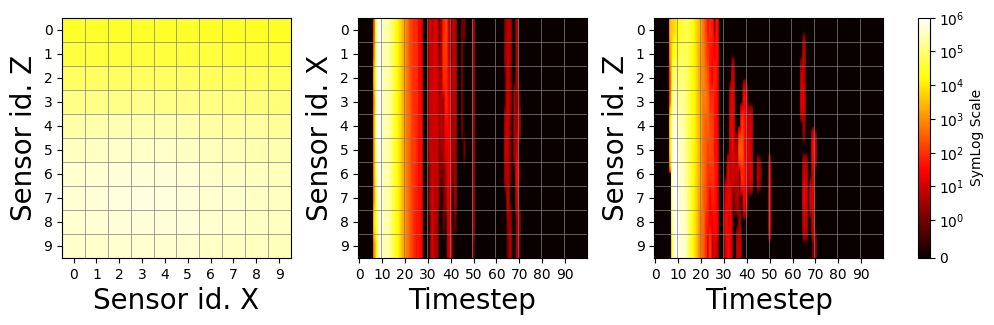

In [16]:
plot_views(index=14941, dataset=dataset, save=False)

In [ ]:
data, p_class = dataset[0]
print("Classe del dato:", p_class)
print("Chiavi disponibili in labels_map:", labels_map.keys())

Classe del dato: (1414.828357570333, (8.022535770706998, 1.9506260120495147, 8.179003699965497), (2.878012191885845, 2.7538292129748183, 2.7884301201933575))
Chiavi disponibili in labels_map: dict_keys([-1, 0, 1, 2, 3])


14900:


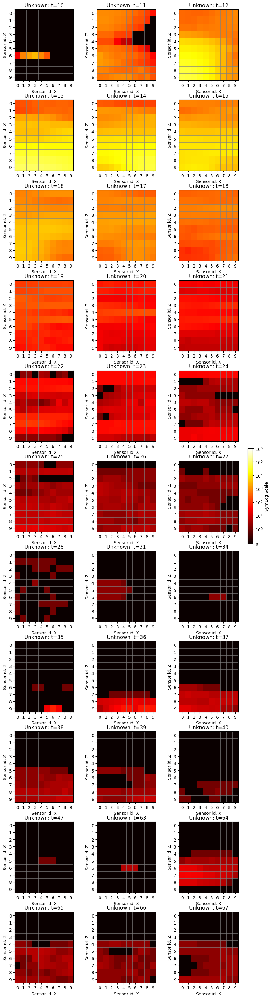

In [ ]:
plot_time_views(index=14900, dataset=dataset, t=None)

### Check Distributions

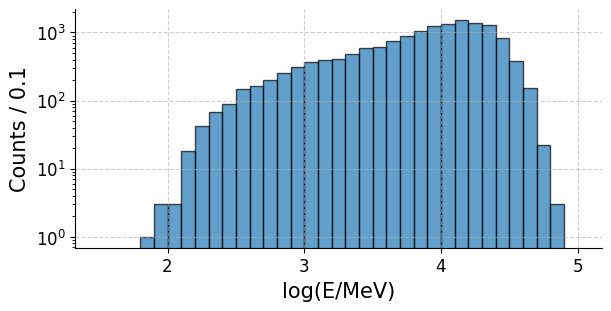

In [17]:
dataset.transform = lambda x: (x[0], ds.to_tensor_and_dtype(np.log10(x[1][0])), torch.float32)
#dataset.transform = lambda x: (x[0], ds.to_tensor_and_dtype(x[1][0]), torch.float32)
dims=["log(E/MeV)"]
fig, axs = plt.subplots(ncols=len(dims), nrows=1, facecolor="w", figsize=(6*len(dims), 3),constrained_layout=True)     
n = 10
bins=np.arange(1.5, 5+1/n, 1/n)
axs.set_ylabel(f"Counts / {1/n}", fontsize=15)
for i in range(len(dims)):    
    energy = np.array([d[1] for d in dataset])
    axs.set_xlabel(dims[i], fontsize=15)
    axs.grid(True, linestyle='--', alpha=0.6)
    axs.spines['top'].set_visible(False)
    axs.spines['right'].set_visible(False)
    axs.set_yscale('log')
        
    axs.tick_params(axis='both', which='major', labelsize=12)
    axs.set_xticks([i for i in range(7)])
    hist = axs.hist(energy, bins, edgecolor='black', alpha=0.7)

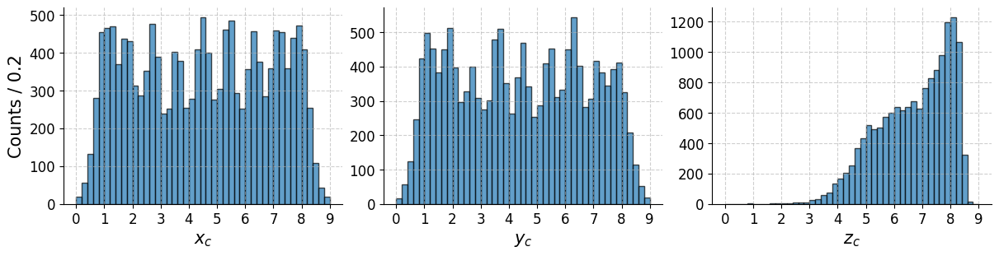

In [18]:
dataset.transform = lambda x: (x[0], ds.to_tensor_and_dtype(x[1][1]), torch.float32)

dims=[r"$x_c$", r"$y_c$", r"$z_c$"]
fig, axs = plt.subplots(ncols=len(dims), nrows=1, facecolor="w", figsize=(4*len(dims), 3),constrained_layout=True)     
n = 5
bins=np.arange(0, 9+1/n, 1/n)
axs[0].set_ylabel(f"Counts / {1/n}", fontsize=15)
for i in range(len(dims)):    
    positions = np.array([d[1][i] for d in dataset])
    axs[i].set_xlabel(dims[i], fontsize=15)
    axs[i].grid(True, linestyle='--', alpha=0.6)
    axs[i].spines['top'].set_visible(False)
    axs[i].spines['right'].set_visible(False)
    #axs[i].set_yscale('log')
        
    axs[i].tick_params(axis='both', which='major', labelsize=12)
    axs[i].set_xticks([i for i in range(10)])
    hist = axs[i].hist(positions, bins, edgecolor='black', alpha=0.7)

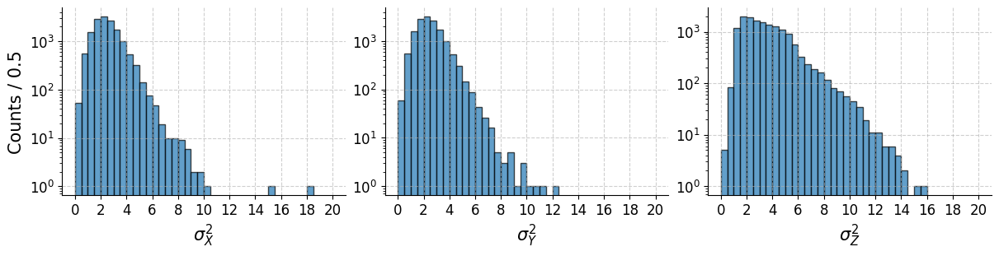

In [19]:
dataset.transform = lambda x: (x[0], ds.to_tensor_and_dtype(x[1][2]), torch.float32)

dims=["X", "Y", "Z"]
fig, axs = plt.subplots(ncols=len(dims), nrows=1, facecolor="w", figsize=(4*len(dims), 3),constrained_layout=True)     
n = 2
bins=np.arange(0, 20+1/n, 1/n)
axs[0].set_ylabel(f"Counts / {1/n}", fontsize=15)
for i in range(len(dims)):    
    dispersions = np.array([d[1][i] for d in dataset])
    axs[i].set_xlabel(dims[i], fontsize=15)
    axs[i].grid(True, linestyle='--', alpha=0.6)
    axs[i].spines['top'].set_visible(False)
    axs[i].spines['right'].set_visible(False)
    axs[i].set_yscale('log')
        
    axs[i].tick_params(axis='both', which='major', labelsize=12)
    axs[i].set_xticks([2*i for i in range(11)])
    hist = axs[i].hist(dispersions, bins, edgecolor='black', alpha=0.7)
    axs[i].set_xlabel(rf"$\sigma^2_{dims[i]}$")

# Train

## Energy and Position

In [20]:
dataset.transform = lambda x: (x[0], ds.to_tensor_and_dtype([np.log10(x[1][0]), *x[1][1]], torch.float32))
train_dataset, test_dataset, val_dataset = ds.build_loaders(dataset, (0.7, 0.15), shuffle=False, num_workers=0)

net_desc_spikefreq["layers"][-1] = 4*population

In [21]:
net_Epos_spk = snnfn.Spiking_Net(net_desc_spikefreq, lambda x: spikegen_multi(x,4)) 
Pred_Epos_spk = snnfn.Predictor(predict_spikefreq, distance, population_sizes=20)
loss_Epos = snnfn.multi_MSELoss(weights=torch.tensor([1,1,1,1]))
opt_Epos_spk = torch.optim.Adam(net_Epos_spk.parameters(), lr=1e-3, betas=(0.9, 0.999), weight_decay=1e-3)
sche_Epos_spk = torch.optim.lr_scheduler.ExponentialLR(opt_Epos_spk, gamma=0.7)
train_Epos_spk = snnfn.Trainer(net_Epos_spk, loss_Epos, opt_Epos_spk, Pred_Epos_spk,
                    train_dataset, val_dataset, test_dataset)

In [22]:
num_epochs = 10
train_Epos_spk.train(num_epochs)

Epoch 0:
Validation Loss = 33.84521717495389
Validation Average Error = [0.5658168  0.64167285 0.6073178         inf]

-------------------------------



Epoch:  10%|█         | 1/10 [01:14<11:10, 74.52s/it]

Epoch 1:
Validation Loss = 4.150465059280395
Validation Average Error = [0.03593338 0.29569075 0.6932508         inf]

-------------------------------



Epoch:  20%|██        | 2/10 [02:28<09:55, 74.39s/it]

Epoch 2:
Validation Loss = 2.4407982561323376
Validation Average Error = [0.02347915 0.26226506 0.45929947        inf]

-------------------------------



Epoch:  30%|███       | 3/10 [03:47<08:53, 76.20s/it]

Epoch 3:
Validation Loss = 1.9117669105529784
Validation Average Error = [0.02139576 0.22977835 0.39457706        inf]

-------------------------------



Epoch:  40%|████      | 4/10 [05:01<07:33, 75.63s/it]

Epoch 4:
Validation Loss = 1.9658172766367594
Validation Average Error = [0.02641001 0.22284669 0.41983065        inf]

-------------------------------



Epoch:  50%|█████     | 5/10 [06:16<06:16, 75.38s/it]

Epoch 5:
Validation Loss = 1.6830109066433376
Validation Average Error = [0.02023147 0.22250144 0.3487632         inf]

-------------------------------



Epoch:  60%|██████    | 6/10 [07:34<05:05, 76.26s/it]

Epoch 6:
Validation Loss = 1.4897007836235894
Validation Average Error = [0.02081764 0.18995951 0.3080318         inf]

-------------------------------



Epoch:  70%|███████   | 7/10 [08:50<03:47, 75.95s/it]

Epoch 7:
Validation Loss = 1.569250970416599
Validation Average Error = [0.02245541 0.1943656  0.29946336        inf]

-------------------------------



Epoch:  80%|████████  | 8/10 [10:46<02:57, 88.91s/it]

Epoch 8:
Validation Loss = 1.3969427426656087
Validation Average Error = [0.01797105 0.16421562 0.28326315        inf]

-------------------------------



Epoch:  90%|█████████ | 9/10 [13:18<01:48, 108.59s/it]

Epoch 9:
Validation Loss = 1.3407229529486762
Validation Average Error = [0.0236148  0.1629948  0.29191378        inf]

-------------------------------



Epoch: 100%|██████████| 10/10 [16:04<00:00, 96.48s/it] 

Epoch 10:
Validation Loss = 1.3653105762269762
Validation Average Error = [0.01753362 0.17398    0.2706776         inf]

-------------------------------



Test loss: 1.4068758222791884
Test relative error: [ 1.8045435 20.431309  30.514011   3.5141807]%


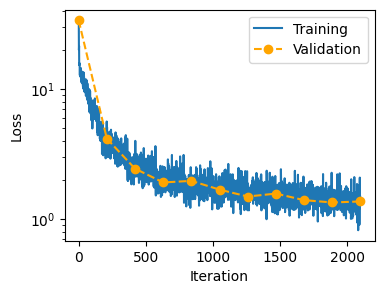

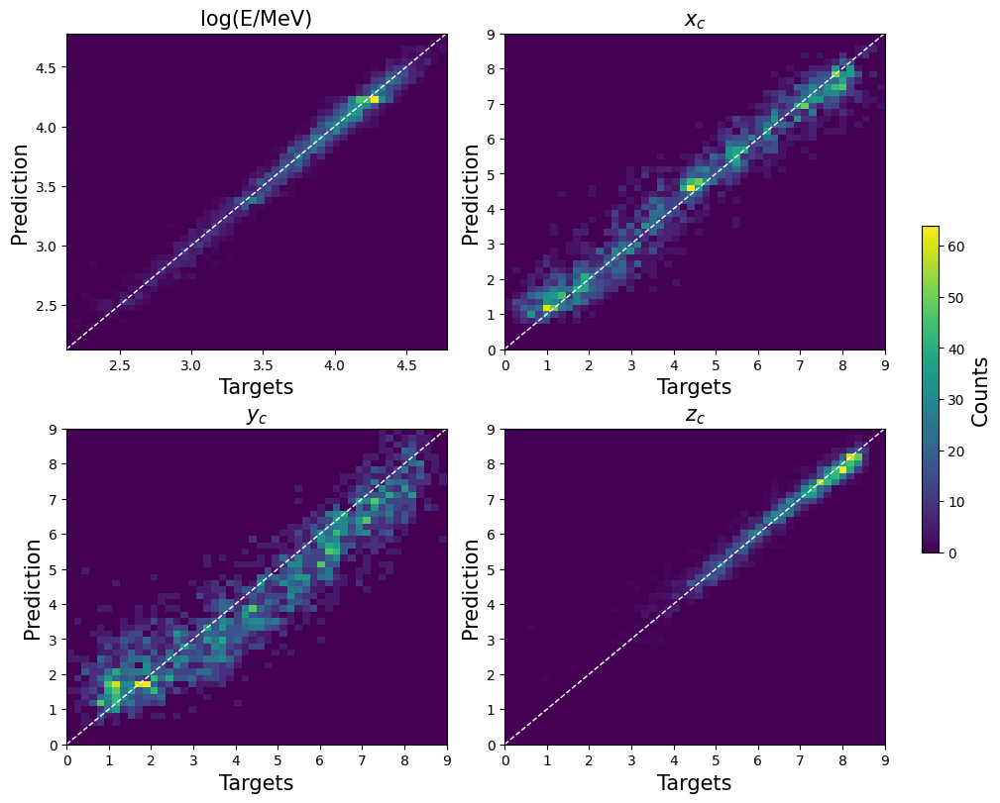

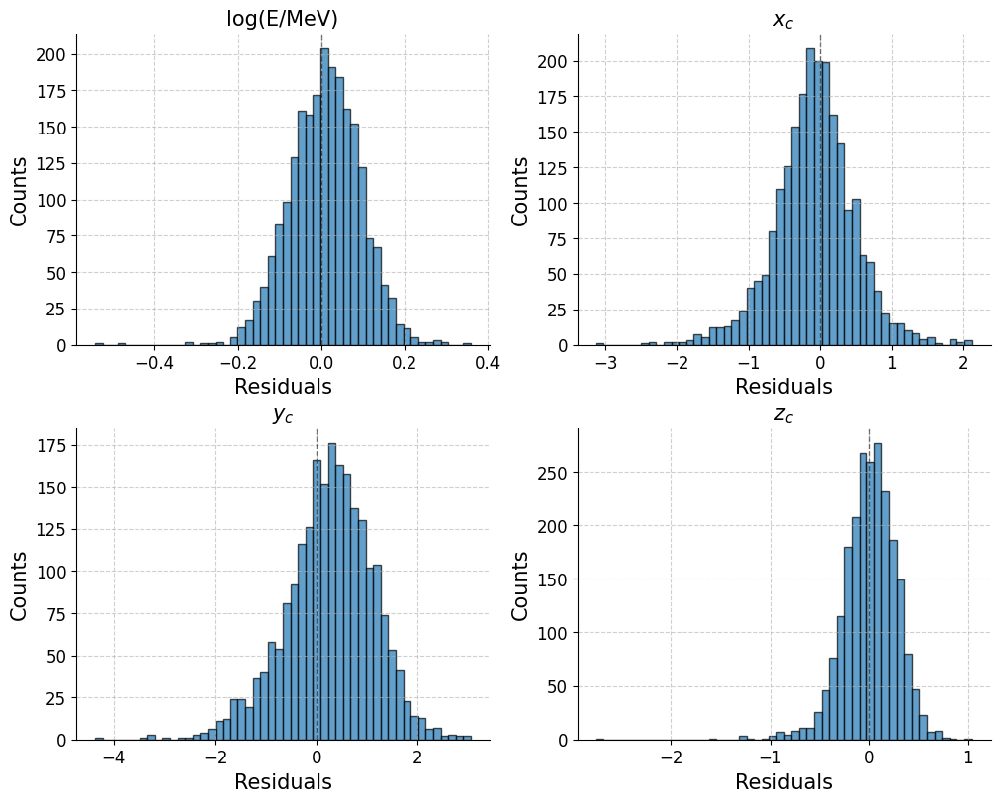

In [28]:
# LogE->E -> transform=antitransform
# errori assoluti -> absolute=True, relative=False -> then divide values for 100 to erase %
# errori relativi -> absolute=True, relative=True
train_Epos_spk.predict.accuracy_fn = lambda p, t: distance(p, t, absolute=True, relative=False)

# for residual plots goodness
train_Epos_spk.predict.accuracy_fn = lambda p, t: distance(p, t, absolute=False, relative=False)

# show results
train_Epos_spk.show_results(nbins=50, title=["log(E/MeV)", r"$x_c$", r"$y_c$", r"$z_c$"])

In [27]:
train_Epos_spk.predict.accuracy_fn = lambda p, t: distance(p, t, absolute=True, relative=True) # relative errors
train_Epos_spk.test("test")
print(f"Test relative error: {train_Epos_spk.acc_hist['test'][train_Epos_spk.current_epoch]}")

Test relative error: [0.01804543 0.20431308 0.3051401  0.03514181]


In [26]:
train_Epos_spk.predict.accuracy_fn = lambda p, t: distance(p, t, absolute=True, relative=False) # absolute errors
train_Epos_spk.test("test")
print(f"Test relative error: {train_Epos_spk.acc_hist['test'][train_Epos_spk.current_epoch]}")

Test relative error: [0.06711779 0.42444965 0.71496195 0.20517801]


In [84]:
train_Epos_spk.predict.accuracy_fn = lambda p, t: distance(p, t, absolute=True, relative=True)
train_Epos_spk.test("test")
train_Epos_spk.predict.accuracy_fn = lambda p, t: distance(p, t, absolute=False, relative=False)
train_Epos_spk.show_results(nbins=50, logscale=True, linthresh=1, title="Energy [MeV]",
                            select=[0], transform=antitransform)

IndexError: too many indices for tensor of dimension 1

In [36]:
train_Epos_spk.predict.accuracy_fn = lambda p, t: distance(p, t, absolute=True, relative=True, transform=antitransform)
train_Epos_spk.test("test")
print(f"Test relative error: {train_Epos_spk.acc_hist['test'][train_Epos_spk.current_epoch]*100}%")

Test relative error: [22.787281  20.308111  38.846695   4.4602556]%


In [37]:
train_Epos_spk.predict.accuracy_fn = lambda p, t: distance(p, t, absolute=True, relative=False, transform=antitransform)
train_Epos_spk.test("test")
print(f"Test relative error: {train_Epos_spk.acc_hist['test'][train_Epos_spk.current_epoch]}")

Test relative error: [2.9809380e+03 5.3269374e-01 8.4527993e-01 2.6718369e-01]


# NOT UPDATED CODE BELOW! RUN AT YOUR OWN RISK!

# Energy and Dispersion

In [29]:
dataset.transform = lambda x: (x[0], ds.to_tensor_and_dtype([np.log10(x[1][0]), *x[1][2]], torch.float32))
train_dataset, test_dataset, val_dataset = ds.build_loaders(dataset, (0.7, 0.15), shuffle=True, num_workers=0)

net_desc_spikefreq["layers"][-1] = 4*population

In [30]:
net_Esigma_spk = snnfn.Spiking_Net(net_desc_spikefreq, lambda x: spikegen_multi(x,4)) 
Pred_Esigma_spk = snnfn.Predictor(predict_spikefreq, distance, population_sizes=20)
loss_Esigma = snnfn.multi_MSELoss(weights=torch.tensor([1,1,1,1]), set_mse=[0,0,0,0])
opt_Esigma_spk = torch.optim.Adam(net_Esigma_spk.parameters(), lr=1e-3, betas=(0.9, 0.999), weight_decay=1e-3)
sche_Esigma_spk = torch.optim.lr_scheduler.ExponentialLR(opt_Esigma_spk, gamma=0.7)
train_Esigma_spk =snnfn.Trainer(net_Esigma_spk, loss_Esigma, opt_Esigma_spk, Pred_Esigma_spk,
                    train_dataset, val_dataset, test_dataset)

In [31]:
num_epochs = 10
train_Esigma_spk.train(num_epochs)

Epoch 0:
Validation Loss = 6.617348872290718
Validation Average Error = [0.7969021  0.49260157 0.6721058  0.40195644]

-------------------------------



Epoch:  10%|█         | 1/10 [01:13<11:04, 73.86s/it]

Epoch 1:
Validation Loss = 1.8487509171168008
Validation Average Error = [0.02577572 0.26990908 0.25895372 0.14500825]

-------------------------------



Epoch:  20%|██        | 2/10 [02:29<09:59, 74.91s/it]

Epoch 2:
Validation Loss = 1.9447004636128744
Validation Average Error = [0.0322401  0.25973898 0.27879703 0.16730039]

-------------------------------



Epoch:  30%|███       | 3/10 [04:02<09:41, 83.01s/it]

Epoch 3:
Validation Loss = 1.858377824889289
Validation Average Error = [0.02566251 0.30069816 0.28126973 0.14760408]

-------------------------------



Epoch:  40%|████      | 4/10 [05:38<08:48, 88.13s/it]

Epoch 4:
Validation Loss = 1.7113725158903335
Validation Average Error = [0.02120613 0.25391233 0.23945363 0.13263932]

-------------------------------



Epoch:  50%|█████     | 5/10 [06:53<06:58, 83.66s/it]

Epoch 5:
Validation Loss = 1.6655891338984172
Validation Average Error = [0.01782431 0.24521968 0.24093623 0.12916093]

-------------------------------



Epoch:  60%|██████    | 6/10 [08:19<05:37, 84.50s/it]

Epoch 6:
Validation Loss = 1.7342466725243462
Validation Average Error = [0.02426028 0.24030279 0.24097301 0.15309416]

-------------------------------



Epoch:  70%|███████   | 7/10 [09:47<04:16, 85.58s/it]

Epoch 7:
Validation Loss = 1.6680255810419717
Validation Average Error = [0.01904843 0.25442103 0.2615706  0.12772405]

-------------------------------



Epoch:  80%|████████  | 8/10 [12:03<03:22, 101.40s/it]

Epoch 8:
Validation Loss = 1.6218316343095567
Validation Average Error = [0.01804996 0.25465542 0.25114807 0.1244732 ]

-------------------------------



Epoch:  90%|█████████ | 9/10 [14:38<01:58, 118.35s/it]

Epoch 9:
Validation Loss = 1.6409058226479425
Validation Average Error = [0.01616714 0.27628735 0.25051752 0.13150708]

-------------------------------



Epoch: 100%|██████████| 10/10 [17:22<00:00, 104.28s/it]

Epoch 10:
Validation Loss = 1.6463177177641126
Validation Average Error = [0.0157546  0.24172767 0.24455422 0.11916542]

-------------------------------



Test loss: 1.632443708843655
Test relative error: [ 5.878201 60.463776 57.054527 39.84786 ]%


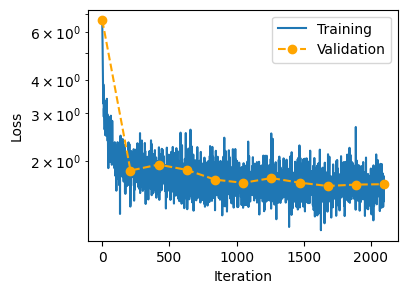

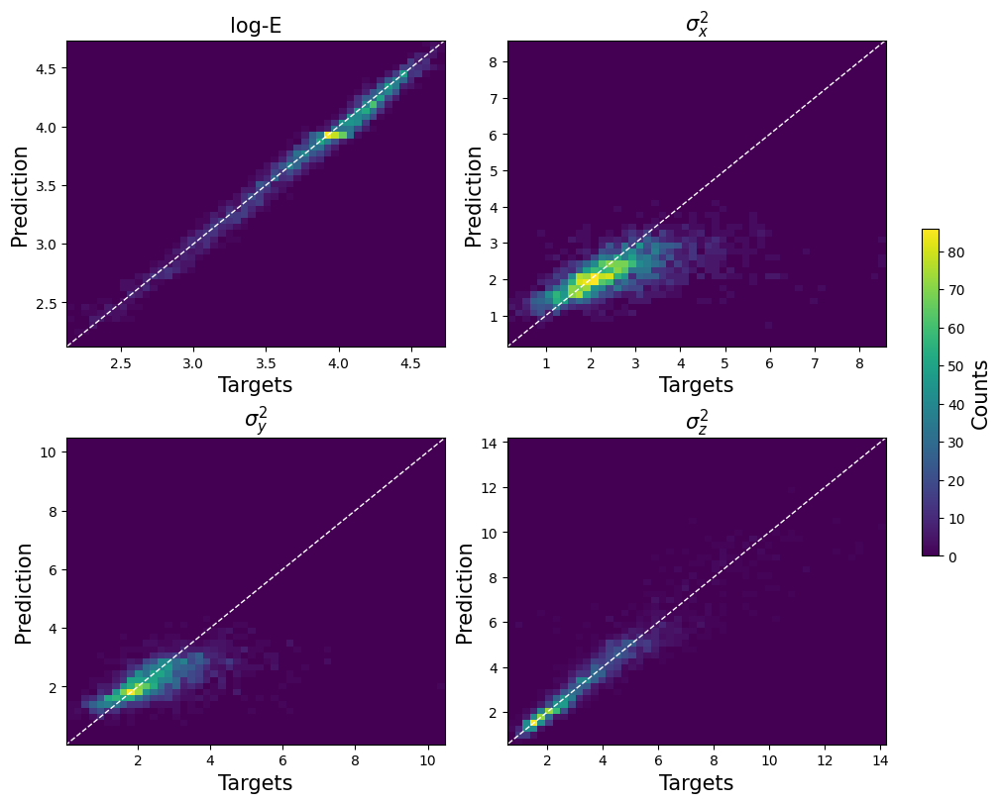

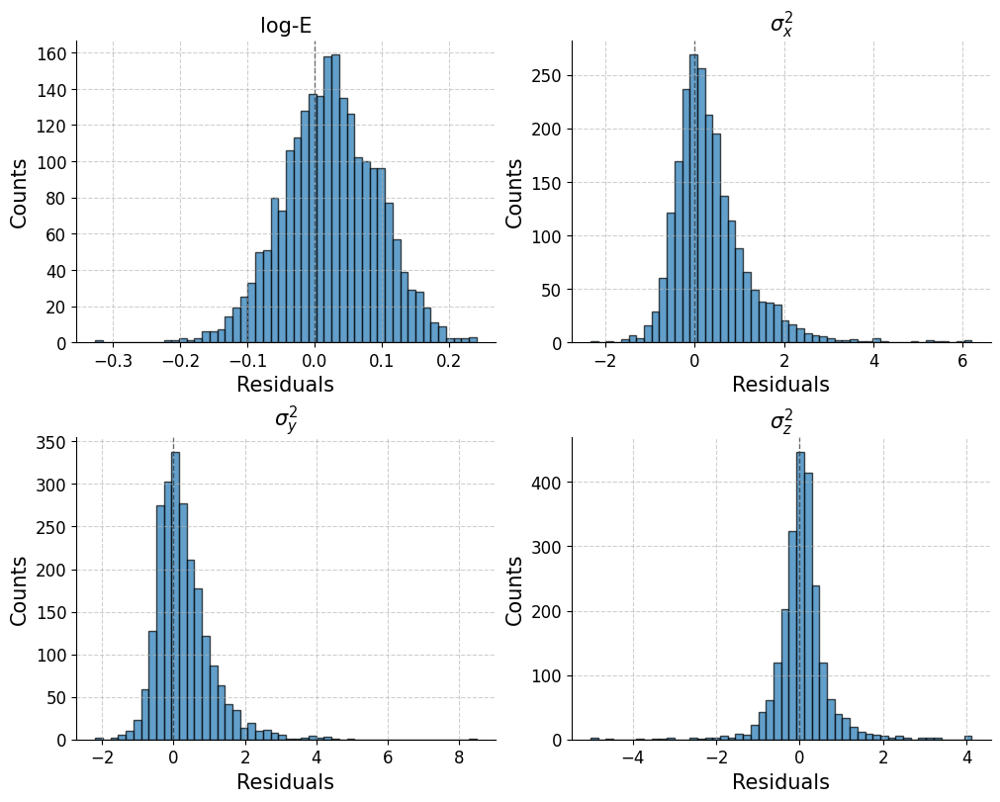

In [32]:
train_Esigma_spk.predict.accuracy_fn = lambda p, t: distance(p, t, absolute=True, relative=False)
train_Esigma_spk.test("test")
train_Esigma_spk.predict.accuracy_fn = lambda p, t: distance(p, t, absolute=False, relative=False)
train_Esigma_spk.show_results(nbins=50, title=["log-E", r"$\sigma^2_x$", r"$\sigma^2_y$", r"$\sigma^2_z$"])

In [35]:
train_Esigma_spk.predict.accuracy_fn = lambda p, t: distance(p, t, absolute=True, relative=False) # absolute errors
train_Esigma_spk.test("test")
print(f"Test relative error: {train_Esigma_spk.acc_hist['test'][train_Esigma_spk.current_epoch]}")

Test relative error: [0.05874562 0.6047272  0.57040757 0.39819264]


In [36]:
train_Esigma_spk.predict.accuracy_fn = lambda p, t: distance(p, t, absolute=True, relative=True) # relative errors
train_Esigma_spk.test("test")
print(f"Test relative error: {train_Esigma_spk.acc_hist['test'][train_Esigma_spk.current_epoch]}")

Test relative error: [0.01582526 0.24746057 0.25261813 0.1155569 ]


Test loss: 2.450439691543579
Test relative error: [ 1.4080755e+05  2.0623589e+01  2.7403551e+01 -2.2147572e+01]%


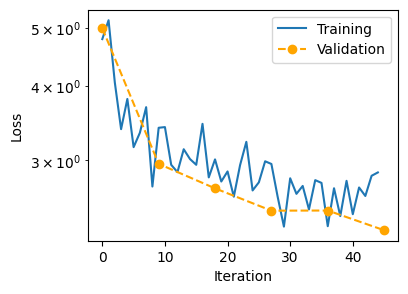

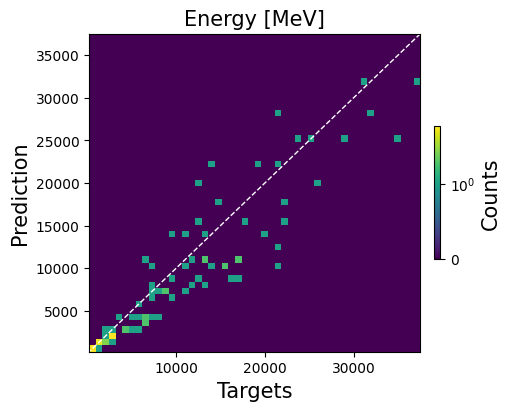

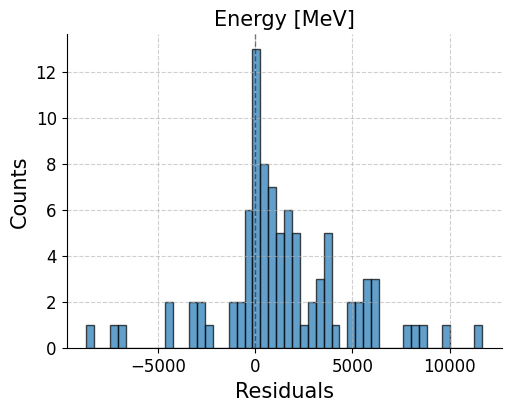

In [35]:
def antitransform(x):
    a = x.clone() 
    a[:, 0] = torch.pow(10, a[:,0])
    return a

train_Esigma_spk.predict.accuracy_fn = lambda p, t: distance(p, t, absolute=False, relative=False, transform=antitransform)

train_Esigma_spk.test("test")
train_Esigma_spk.show_results(nbins=50, logscale=True, linthresh=1, title="Energy [MeV]",
                            select=[0], transform=antitransform)

In [36]:
train_Esigma_spk.predict.accuracy_fn = lambda p, t: distance(p, t, absolute=True, relative=True, transform=antitransform)
train_Esigma_spk.test("test")
print(f"Test relative error: {train_Esigma_spk.acc_hist['test'][train_Esigma_spk.current_epoch]*100}%")

Test relative error: [26.807323 28.68752  27.965158 35.482224]%


In [37]:
train_Esigma_spk.predict.accuracy_fn = lambda p, t: distance(p, t, absolute=True, relative=False, transform=antitransform)
train_Esigma_spk.test("test")
print(f"Test relative error: {train_Esigma_spk.acc_hist['test'][train_Esigma_spk.current_epoch]}")

Test relative error: [2.5357617e+03 6.8050170e-01 6.7504328e-01 9.3760210e-01]


# Dispersion

In [31]:
dataset.transform = lambda x: (x[0], ds.to_tensor_and_dtype(x[1][2], torch.float32))
train_dataset, test_dataset, val_dataset = ds.build_loaders(dataset, (0.7, 0.15), shuffle=True, num_workers=0)

In [32]:
net_desc_spikefreq["layers"][-1] = 90
net_sigma_spk = snnfn.Spiking_Net(net_desc_spikefreq, lambda x: spikegen_multi(x,4)) 
Pred_sigma_spk = snnfn.Predictor(predict_spikefreq, distance, population_sizes=30)
loss_sigma = snnfn.multi_MSELoss(weights=torch.tensor([1,1,1]))
opt_sigma_spk = torch.optim.Adam(net_sigma_spk.parameters(), lr=5e-4, betas=(0.9, 0.999))
train_sigma_spk = snnfn.Trainer(net_sigma_spk, loss_sigma, opt_sigma_spk, Pred_sigma_spk,
                    train_dataset, val_dataset, test_dataset)

In [33]:
num_epochs = 10
train_sigma_spk.train(num_epochs)

Epoch 0:
Validation Loss = 8.706817679935032
Validation Average Error = [0.3884586  0.51413816 0.42270735]

-------------------------------



Epoch:  10%|█         | 1/10 [00:17<02:37, 17.46s/it]

Epoch 1:
Validation Loss = 4.2588456471761065
Validation Average Error = [0.33207798 0.3499941  0.3522701 ]

-------------------------------



Epoch:  20%|██        | 2/10 [00:32<02:09, 16.16s/it]

Epoch 2:
Validation Loss = 2.984282652537028
Validation Average Error = [0.29805472 0.32727614 0.22167121]

-------------------------------



Epoch:  30%|███       | 3/10 [00:48<01:51, 15.94s/it]

Epoch 3:
Validation Loss = 2.7142370409435697
Validation Average Error = [0.2857187  0.30805576 0.18051335]

-------------------------------



Epoch:  40%|████      | 4/10 [01:05<01:38, 16.34s/it]

Epoch 4:
Validation Loss = 2.6425786548190646
Validation Average Error = [0.3005224  0.36033148 0.17565016]

-------------------------------



Epoch:  50%|█████     | 5/10 [01:21<01:21, 16.22s/it]

Epoch 5:
Validation Loss = 2.6076371007495456
Validation Average Error = [0.2967649  0.37073582 0.1783602 ]

-------------------------------



Epoch:  60%|██████    | 6/10 [01:36<01:03, 15.97s/it]

Epoch 6:
Validation Loss = 2.571797529856364
Validation Average Error = [0.34739366 0.3496936  0.16723172]

-------------------------------



Epoch:  70%|███████   | 7/10 [01:52<00:47, 15.98s/it]

Epoch 7:
Validation Loss = 2.6827602783838906
Validation Average Error = [0.26632634 0.2905574  0.18761437]

-------------------------------



Epoch:  80%|████████  | 8/10 [02:07<00:31, 15.61s/it]

Epoch 8:
Validation Loss = 2.5717839267518787
Validation Average Error = [0.2793969  0.32797676 0.1761073 ]

-------------------------------



Epoch:  90%|█████████ | 9/10 [02:23<00:15, 15.76s/it]

Epoch 9:
Validation Loss = 2.482682373788622
Validation Average Error = [0.29621255 0.32229903 0.18395257]

-------------------------------



Epoch: 100%|██████████| 10/10 [02:38<00:00, 15.90s/it]

Epoch 10:
Validation Loss = 2.4813217719395957
Validation Average Error = [0.2796741 0.2875368 0.1684116]

-------------------------------



In [34]:
f = r"$\sigma_X$"
"sigma" in f

True

Test loss: 2.1492471827401056
Test relative error: [24.005453 25.359758 15.843309]%


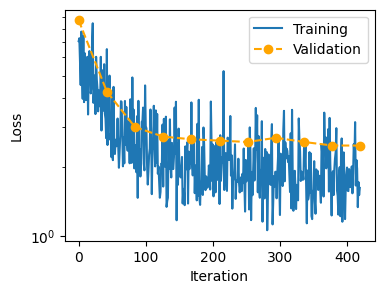

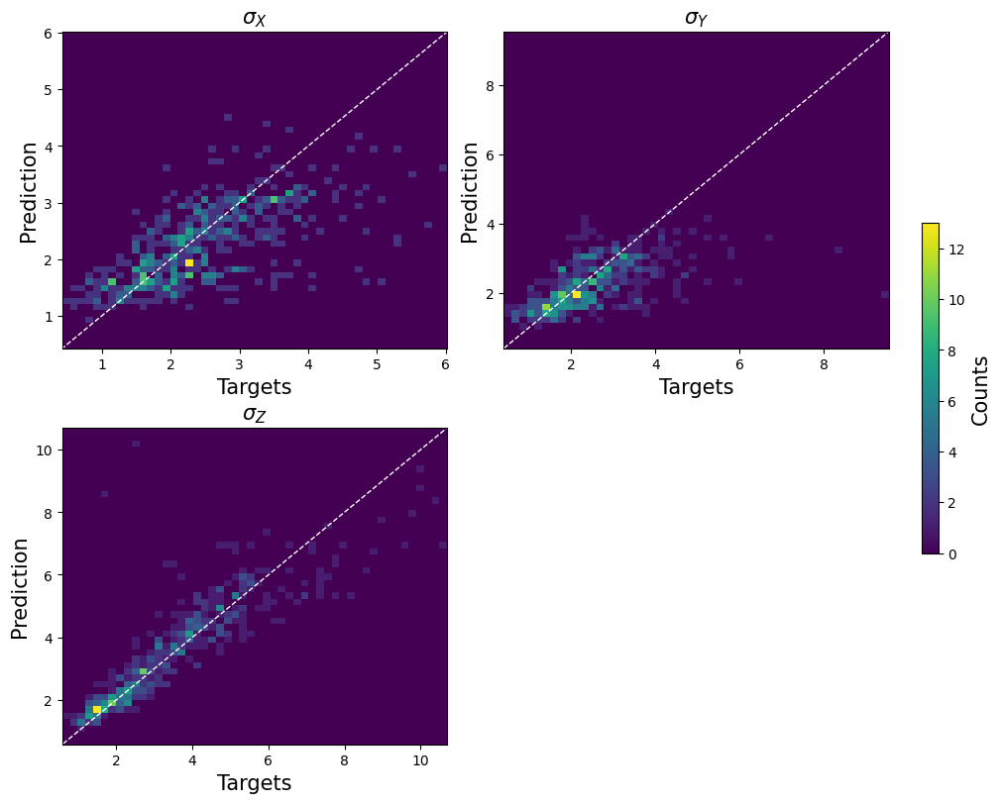

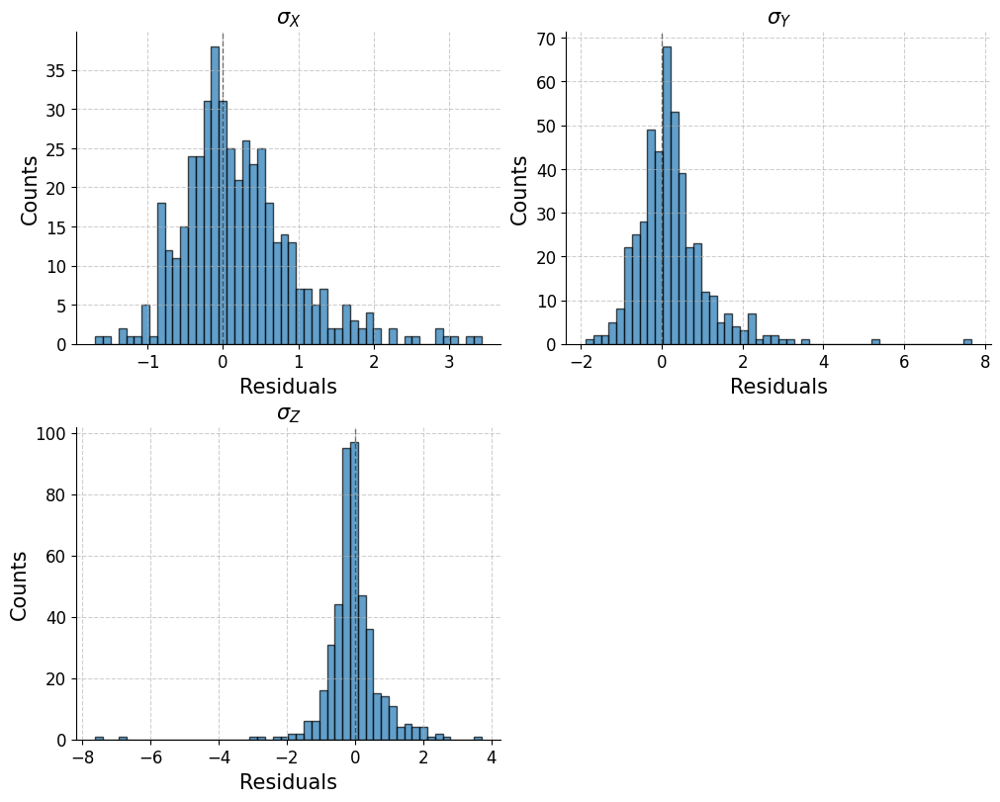

In [35]:
train_sigma_spk.predict.accuracy_fn = lambda p, t: distance(p, t, absolute=True, relative=True)
train_sigma_spk.test("test")
train_sigma_spk.predict.accuracy_fn = lambda p, t: distance(p, t, absolute=False, relative=False)
train_sigma_spk.show_results(nbins=50, title=[r"$\sigma_X$", r"$\sigma_Y$", r"$\sigma_Z$"])

# Particle Classification

In [45]:
data_train, data_test, data_val = ds.build_dataset("../DataThesis/uniform/mufix_po_uni_200e", max_files=200, target="particle")

ValueError: too many values to unpack (expected 3)

In [ ]:
batch_size = 50
nw = 0
train_load = DataLoader(data_train[:(len(data_train)//batch_size)*batch_size], batch_size=batch_size, shuffle=True, num_workers=nw)
val_load   = DataLoader(data_val[:(len(data_val)//batch_size)*batch_size],     batch_size=batch_size, shuffle=True, num_workers=nw)
test_load  = DataLoader(data_test[:(len(data_test)//batch_size)*batch_size],   batch_size=batch_size, shuffle=True, num_workers=nw)

In [ ]:
from collections import Counter
Counter([d[1] for d in data_train])

In [ ]:
#loss = nn.MSELoss()
num_inputs = 100
num_hidden = 200
num_outputs = nClasses
num_steps = timesteps
net = Net_LIF_1L(num_inputs, num_hidden, num_outputs, num_steps)

In [ ]:
def comp_accuracy(output, targets):
    _, predicted = output.sum(dim=0).max(1)
    total = targets.size(0)
    correct = (predicted == targets).sum().item()

    return predicted, correct/total

In [ ]:
loss_fn = SF.ce_count_loss(num_classes=nClasses)
optimizer = torch.optim.Adam(net.parameters(), lr=5e-4, betas=(0.9, 0.999))

train_net = Trainer(net, loss_fn, optimizer, train_load, val_load, test_load, comp_accuracy)

In [ ]:
num_epochs = 5
train_net.train(num_epochs)

In [ ]:
train_net.plot_loss()

In [ ]:
train_net.test("test", mc=True, num_classes=nClasses)
print(train_net.loss_hist["test"])
train_net.cm["test"].plot()

# Energy Regression

In [78]:
dataset.transform = lambda x: (x[0], ds.to_tensor_and_dtype(np.log10(x[1][0]), torch.float32))
train_dataset, test_dataset, val_dataset = ds.build_loaders(dataset, (0.7, 0.15), shuffle=True, num_workers=0)

In [77]:
from torch import nn

net_E_spk = snnfn.Spiking_Net(net_desc_spikefreq, lambda x: spikegen_multi(x,4)) 
Pred_E_spk = snnfn.Predictor(predict_spikefreq, distance, population_sizes=20)
loss_E = nn.MSELoss()
opt_E_spk = torch.optim.Adam(net_E_spk.parameters(), lr=1e-3, betas=(0.9, 0.999), weight_decay=1e-3)
sche_E_spk = torch.optim.lr_scheduler.ExponentialLR(opt_E_spk, gamma=0.7)
train_E_spk = snnfn.Trainer(net_E_spk, loss_E, opt_E_spk, Pred_E_spk,
                    train_dataset, val_dataset, test_dataset)

In [79]:
num_epochs = 10
train_E_spk.train(num_epochs)

Epoch 0:
Validation Loss = 3.6250307824876575
Validation Average Error = 0.467788964509964

-------------------------------



Epoch:  10%|█         | 1/10 [00:27<04:07, 27.48s/it]

Epoch 1:
Validation Loss = 0.04089234127766556
Validation Average Error = 0.043724413961172104

-------------------------------



Epoch:  20%|██        | 2/10 [00:45<02:56, 22.06s/it]

Epoch 2:
Validation Loss = 0.019875000541408856
Validation Average Error = 0.030370451509952545

-------------------------------



Epoch:  30%|███       | 3/10 [01:07<02:32, 21.78s/it]

Epoch 3:
Validation Loss = 0.015444943370918432
Validation Average Error = 0.02699906751513481

-------------------------------



Epoch:  40%|████      | 4/10 [01:24<01:59, 19.93s/it]

Epoch 4:
Validation Loss = 0.013235685829487111
Validation Average Error = 0.02483481727540493

-------------------------------



Epoch:  50%|█████     | 5/10 [01:44<01:39, 19.98s/it]

Epoch 5:
Validation Loss = 0.011709119400216473
Validation Average Error = 0.023412026464939117

-------------------------------



Epoch:  60%|██████    | 6/10 [02:02<01:16, 19.24s/it]

Epoch 6:
Validation Loss = 0.010369552609821161
Validation Average Error = 0.021712997928261757

-------------------------------



Epoch:  70%|███████   | 7/10 [02:22<00:58, 19.49s/it]

Epoch 7:
Validation Loss = 0.009346902629153596
Validation Average Error = 0.020017437636852264

-------------------------------



Epoch:  80%|████████  | 8/10 [02:39<00:37, 18.94s/it]

Epoch 8:
Validation Loss = 0.008583017624914646
Validation Average Error = 0.01947362907230854

-------------------------------



Epoch:  90%|█████████ | 9/10 [03:02<00:20, 20.17s/it]

Epoch 9:
Validation Loss = 0.008114819466653798
Validation Average Error = 0.019037380814552307

-------------------------------



Epoch: 100%|██████████| 10/10 [03:23<00:00, 20.32s/it]

Epoch 10:
Validation Loss = 0.008056637365370989
Validation Average Error = 0.01945626176893711

-------------------------------



Test loss: 0.007266872614208195
Test relative error: 1.803188443183899%


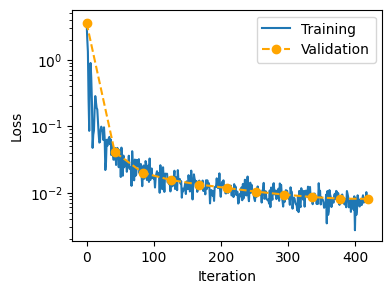

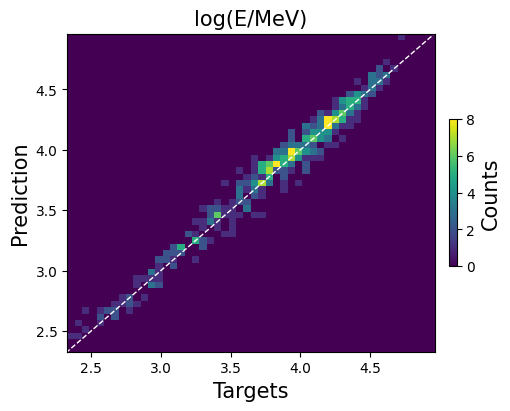

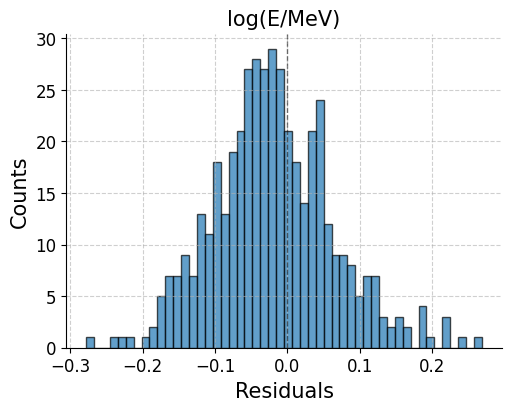

In [80]:
train_E_spk.predict.accuracy_fn = lambda p, t: distance(p, t, absolute=True, relative=True)
train_E_spk.test("test")
train_E_spk.predict.accuracy_fn = lambda p, t: distance(p, t, absolute=False, relative=False)
train_E_spk.show_results(nbins=50, title="log(E/MeV)")

In [ ]:
train_E_spk.predict.accuracy_fn = lambda p, t: distance(p, t, absolute=True, relative=False)
train_E_spk.test("test")
print(f"Test relative error: {train_E_spk.acc_hist['test'][train_E_spk.current_epoch]}")

In [ ]:
def expon(x):
    return torch.pow(10, x)
train_E_spk.predict.accuracy_fn = lambda p, t: distance(p, t, absolute=True, relative=True, transform=expon)
train_E_spk.test("test")
print(f"Test relative error: {train_E_spk.acc_hist['test'][train_E_spk.current_epoch]*100}%")

In [ ]:
train_E_spk.predict.accuracy_fn = lambda p, t: distance(p, t, absolute=True, relative=False, transform=expon)
train_E_spk.test("test")
print(f"Test relative error: {train_E_spk.acc_hist['test'][train_E_spk.current_epoch]}")

In [ ]:
train_E_spk.predict.accuracy_fn = lambda p, t: distance(p, t, absolute=False, relative=False, transform=expon)
train_E_spk.show_results(nbins=50, title="E [MeV]", transform=expon, logscale=True, linthresh=1)

# X

In [ ]:
dataset.transform = lambda x: (x[0], ds.to_tensor_and_dtype(x[1][1][0], torch.float32))
train_dataset, test_dataset, val_dataset = ds.build_loaders(dataset, (0.7, 0.15), shuffle=True, num_workers=0)

In [ ]:
net_X_spk = Spiking_Net(net_desc_spikefreq, lambda x: spikegen_multi(x,4)) 
Pred_X_spk = Predictor(predict_spikefreq, distance, population_sizes=20)
loss_X = nn.MSELoss()
opt_X_spk = torch.optim.Adam(net_X_spk.parameters(), lr=1e-3, betas=(0.9, 0.999), weight_decay=1e-3)
sche_X_spk = torch.optim.lr_scheduler.ExponentialLR(opt_X_spk, gamma=0.7)
train_X_spk = Trainer(net_X_spk, loss_X, opt_X_spk, Pred_X_spk,
                    train_dataset, val_dataset, test_dataset)

In [ ]:
num_epochs = 5
train_X_spk.train(num_epochs)

In [ ]:
train_X_spk.predict.accuracy_fn = lambda p, t: distance(p, t, absolute=True, relative=True)
train_X_spk.test("test")
train_X_spk.predict.accuracy_fn = lambda p, t: distance(p, t, absolute=False, relative=False)
train_X_spk.show_results(nbins=50, title=r"$x_c$")

In [ ]:
train_X_spk.predict.accuracy_fn = lambda p, t: distance(p, t, absolute=True, relative=False)
train_X_spk.test("test")
print(f"Test relative error: {train_X_spk.acc_hist['test'][train_X_spk.current_epoch]}")

# Y

In [ ]:
dataset.transform = lambda x: (x[0], ds.to_tensor_and_dtype(x[1][1][1], torch.float32))
train_dataset, test_dataset, val_dataset = ds.build_loaders(dataset, (0.7, 0.15), shuffle=True, num_workers=0)

In [ ]:
net_Y_spk = Spiking_Net(net_desc_spikefreq, lambda x: spikegen_multi(x,4)) 
Pred_Y_spk = Predictor(predict_spikefreq, distance, population_sizes=20)
loss_Y = nn.MSELoss()
opt_Y_spk = torch.optim.Adam(net_Y_spk.parameters(), lr=1e-3, betas=(0.9, 0.999), weight_decay=1e-3)
sche_Y_spk = torch.optim.lr_scheduler.ExponentialLR(opt_Y_spk, gamma=0.7)
train_Y_spk = Trainer(net_Y_spk, loss_Y, opt_Y_spk, Pred_Y_spk,
                    train_dataset, val_dataset, test_dataset)

In [ ]:
num_epochs = 5
train_Y_spk.train(num_epochs)

In [ ]:
train_Y_spk.predict.accuracy_fn = lambda p, t: distance(p, t, absolute=True, relative=True)
train_Y_spk.test("test")
train_Y_spk.predict.accuracy_fn = lambda p, t: distance(p, t, absolute=False, relative=False)
train_Y_spk.show_results(nbins=50, title=r"$y_c$")

In [ ]:
train_Y_spk.predict.accuracy_fn = lambda p, t: distance(p, t, absolute=True, relative=False)
train_Y_spk.test("test")
print(f"Test relative error: {train_Y_spk.acc_hist['test'][train_Y_spk.current_epoch]}")

# Z

In [ ]:
dataset.transform = lambda x: (x[0], ds.to_tensor_and_dtype(x[1][1][2], torch.float32))
train_dataset, test_dataset, val_dataset = ds.build_loaders(dataset, (0.7, 0.15), shuffle=True, num_workers=0)

In [ ]:
net_Z_spk = Spiking_Net(net_desc_spikefreq, lambda x: spikegen_multi(x,4)) 
Pred_Z_spk = Predictor(predict_spikefreq, distance, population_sizes=20)
loss_Z = nn.L1Loss()
opt_Z_spk = torch.optim.Adam(net_Z_spk.parameters(), lr=1e-3, betas=(0.9, 0.999), weight_decay=1e-3)
sche_Z_spk = torch.optim.lr_scheduler.ExponentialLR(opt_Z_spk, gamma=0.7)
train_Z_spk = Trainer(net_Z_spk, loss_Z, opt_Z_spk, Pred_Z_spk,
                    train_dataset, val_dataset, test_dataset)

In [ ]:
num_epochs = 5
train_Z_spk.train(num_epochs)

In [ ]:
train_Z_spk.predict.accuracy_fn = lambda p, t: distance(p, t, absolute=True, relative=True)
train_Z_spk.test("test")
train_Z_spk.predict.accuracy_fn = lambda p, t: distance(p, t, absolute=False, relative=False)
train_Z_spk.show_results(nbins=50, title=r"$z_c$")

In [ ]:
train_Z_spk.predict.accuracy_fn = lambda p, t: distance(p, t, absolute=True, relative=False)
train_Z_spk.test("test")
print(f"Test relative error: {train_Z_spk.acc_hist['test'][train_Z_spk.current_epoch]}")

# Sigma X

In [ ]:
dataset.transform = lambda x: (x[0], ds.to_tensor_and_dtype(x[1][2][0], torch.float32))
train_dataset, test_dataset, val_dataset = ds.build_loaders(dataset, (0.7, 0.15), shuffle=True, num_workers=0)

In [ ]:
net_sigmaX_spk = Spiking_Net(net_desc_spikefreq, lambda x: spikegen_multi(x,4)) 
Pred_sigmaX_spk = Predictor(predict_spikefreq, distance, population_sizes=20)
loss_sigmaX = nn.L1Loss()
opt_sigmaX_spk = torch.optim.Adam(net_sigmaX_spk.parameters(), lr=1e-3, betas=(0.9, 0.999), weight_decay=1e-3)
sche_sigmaX_spk = torch.optim.lr_scheduler.ExponentialLR(opt_sigmaX_spk, gamma=0.7)
train_sigmaX_spk = Trainer(net_sigmaX_spk, loss_sigmaX, opt_sigmaX_spk, Pred_sigmaX_spk,
                    train_dataset, val_dataset, test_dataset)

In [ ]:
num_epochs = 5
train_sigmaX_spk.train(num_epochs)

In [ ]:
train_sigmaX_spk.predict.accuracy_fn = lambda p, t: distance(p, t, absolute=True, relative=True)
train_sigmaX_spk.test("test")
train_sigmaX_spk.predict.accuracy_fn = lambda p, t: distance(p, t, absolute=False, relative=False)
train_sigmaX_spk.show_results(nbins=50, title=r"$\sigma^2_x$")

In [ ]:
train_sigmaX_spk.predict.accuracy_fn = lambda p, t: distance(p, t, absolute=True, relative=False)
train_sigmaX_spk.test("test")
print(f"Test relative error: {train_sigmaX_spk.acc_hist['test'][train_sigmaX_spk.current_epoch]}")

# Sigma Y

In [ ]:
dataset.transform = lambda x: (x[0], ds.to_tensor_and_dtype(x[1][2][0], torch.float32))
train_dataset, test_dataset, val_dataset = ds.build_loaders(dataset, (0.7, 0.15), shuffle=True, num_workers=0)

In [ ]:
net_sigmaY_spk = Spiking_Net(net_desc_spikefreq, lambda x: spikegen_multi(x,4)) 
Pred_sigmaY_spk = Predictor(predict_spikefreq, distance, population_sizes=20)
loss_sigmaY = nn.L1Loss()
opt_sigmaY_spk = torch.optim.Adam(net_sigmaY_spk.parameters(), lr=1e-3, betas=(0.9, 0.999), weight_decay=1e-3)
sche_sigmaY_spk = torch.optim.lr_scheduler.ExponentialLR(opt_sigmaY_spk, gamma=0.7)
train_sigmaY_spk = Trainer(net_sigmaY_spk, loss_sigmaY, opt_sigmaY_spk, Pred_sigmaY_spk,
                    train_dataset, val_dataset, test_dataset)

In [ ]:
num_epochs = 5
train_sigmaY_spk.train(num_epochs)

In [ ]:
train_sigmaY_spk.predict.accuracy_fn = lambda p, t: distance(p, t, absolute=True, relative=True)
train_sigmaY_spk.test("test")
train_sigmaY_spk.predict.accuracy_fn = lambda p, t: distance(p, t, absolute=False, relative=False)
train_sigmaY_spk.show_results(nbins=50, title=r"$\sigma^2_y$")

In [ ]:
train_sigmaY_spk.predict.accuracy_fn = lambda p, t: distance(p, t, absolute=True, relative=False)
train_sigmaY_spk.test("test")
print(f"Test relative error: {train_sigmaY_spk.acc_hist['test'][train_sigmaY_spk.current_epoch]}")

# Sigma Z

In [ ]:
dataset.transform = lambda x: (x[0], ds.to_tensor_and_dtype(x[1][2][2], torch.float32))
train_dataset, test_dataset, val_dataset = ds.build_loaders(dataset, (0.7, 0.15), shuffle=True, num_workers=0)

net_desc_spikefreq["layers"][-1] = 1*population

In [ ]:
net_sigmaZ_spk = Spiking_Net(net_desc_spikefreq, lambda x: spikegen_multi(x,4)) 
Pred_sigmaZ_spk = Predictor(predict_spikefreq, distance, population_sizes=20)
loss_sigmaZ = nn.L1Loss()
opt_sigmaZ_spk = torch.optim.Adam(net_sigmaZ_spk.parameters(), lr=1e-3, betas=(0.9, 0.999), weight_decay=1e-3)
sche_sigmaZ_spk = torch.optim.lr_scheduler.ExponentialLR(opt_sigmaZ_spk, gamma=0.7)
train_sigmaZ_spk = Trainer(net_sigmaZ_spk, loss_sigmaZ, opt_sigmaZ_spk, Pred_sigmaZ_spk,
                    train_dataset, val_dataset, test_dataset)

In [ ]:
num_epochs = 5
train_sigmaZ_spk.train(num_epochs)

In [ ]:
train_sigmaZ_spk.predict.accuracy_fn = lambda p, t: distance(p, t, absolute=True, relative=True)
train_sigmaZ_spk.test("test")
train_sigmaZ_spk.predict.accuracy_fn = lambda p, t: distance(p, t, absolute=False, relative=False)
train_sigmaZ_spk.show_results(nbins=50, title=r"$\sigma^2_z$")

In [ ]:
train_sigmaZ_spk.predict.accuracy_fn = lambda p, t: distance(p, t, absolute=True, relative=False)
train_sigmaZ_spk.test("test")
print(f"Test relative error: {train_sigmaZ_spk.acc_hist['test'][train_sigmaZ_spk.current_epoch]}")

### Membrane Potential

In [ ]:
net_E_mem = Spiking_Net(net_desc_membrane, lambda x: spikegen_multi(x,4)) 
Pred = Predictor(predict_membrane)
loss_fn = nn.MSELoss() #multi_MSELoss(weights=torch.tensor([1]))
optimizer = torch.optim.Adam(net_E_mem.parameters(), lr=5e-4, betas=(0.9, 0.999))
train_net = Trainer(net_E_mem, loss_fn, optimizer, Pred,
                    train_dataset, val_dataset, test_dataset)

In [ ]:
num_epochs = 5
train_net.train(num_epochs)

In [ ]:
train_net.test("test")
train_net.show_results(nbins=50)

In [ ]:
def antitransform(x):
    return torch.pow(10, x)
train_net.predict.transform = antitransform

train_net.test("test")
train_net.show_results(nbins=50, logscale=True, linthresh=1, title="Total Energy [MeV]")

In [ ]:
train_net.test("test")
print(f"Test loss: {train_net.loss_hist['test'][num_epochs]}")
print(f"Test relative error: {train_net.acc_hist['test'][num_epochs]*100}%")
train_net.plot_loss()
train_net.plot_pred_vs_target(50, logscale=False, linthresh=1)

In [ ]:
def antitransform(x):
    return torch.pow(10, x)

train_net.test("test", transform=antitransform)
print(f"Test loss: {train_net.loss_hist['test'][num_epochs]}")
print(f"Test relative error: {train_net.acc_hist['test'][num_epochs]*100}%")
train_net.plot_pred_vs_target(50, transform=antitransform, logscale=True, linthresh=1)

### SpikeFreq

In [ ]:
net_E_spk = Spiking_Net(net_desc_spikefreq, lambda x: spikegen_multi(x,4)) 
Pred_E_spk = Predictor(predict_spikefreq)
loss_fn = nn.MSELoss() #multi_MSELoss(weights=torch.tensor([1]))
opt_E_spk = torch.optim.Adam(net_E_spk.parameters(), lr=5e-4, betas=(0.9, 0.999))
train_E_spk = Trainer(net_E_spk, loss_fn, opt_E_spk, Pred_E_spk,
                      train_dataset, val_dataset, test_dataset)

In [ ]:
num_epochs = 5
train_E_spk.train(num_epochs)

In [ ]:
train_E_spk.test("test")
train_E_spk.show_results(nbins=50)

In [ ]:
def antitransform(x):
    return torch.pow(10, x)
train_E_spk.predict.transform = antitransform

train_E_spk.test("test")
train_E_spk.show_results(nbins=50, logscale=True, linthresh=1, title="Total Energy [MeV]")

In [ ]:
net_E_spk = Spiking_Net(net_desc_spikefreq, lambda x: spikegen_multi(x,4))

loss_fn = nn.MSELoss()
opt_E_spk = torch.optim.Adam(net_E_spk.parameters(), lr=5e-4, betas=(0.9, 0.999))
train_E_spk = Trainer(net_E_spk, loss_fn, opt_E_spk, train_dataset, val_dataset, test_dataset, predict_spikefreq)

In [ ]:
num_epochs=5
train_E_spk.train(num_epochs)

train_E_spk.test("test")
print(f"Test loss: {train_E_spk.loss_hist['test'][num_epochs]}")
print(f"Test relative error: {train_E_spk.acc_hist['test'][num_epochs]*100}%")
train_E_spk.plot_loss()
train_E_spk.plot_pred_vs_target(50, logscale=False, linthresh=1)

In [ ]:
def antitransform(x):
    return torch.pow(10, x)

train_E_spk.test("test", transform=antitransform)
print(f"Test loss: {train_E_spk.loss_hist['test'][num_epochs]}")
print(f"Test relative error: {train_E_spk.acc_hist['test'][num_epochs]*100}%")
train_E_spk.plot_pred_vs_target(50, transform=antitransform, logscale=True, linthresh=1)

In [ ]:
net.eval()
all_x = []
all_predictions = []
with torch.no_grad():
    for data, targets in test_dataset:
        data = data.to(device)
        targets = targets.to(device)

        # forward pass
        output = net_E_spk(data)
        # calculate total accuracy
        pred, acc = predict_spikefreq(output, targets, antitransform)
        all_predictions.extend(pred.tolist())
        all_x.extend(data.sum((1,2)).tolist())
        
fig = plt.figure(facecolor="w", figsize=(10, 6))
plt.xlabel("Photon Count")
plt.ylabel("Energy Prediction [MeV]")
plt.hist2d(all_x, all_predictions, 50, norm=SymLogNorm(linthresh=1), cmap='viridis')
# Add a color bar
plt.colorbar(label='Counts')
plt.plot([0, 1e5], [0, 1e5], color='white', linewidth=1, linestyle='--')

### Linear Model

In [ ]:
data_train, data_test, data_val = ds.build_dataset("../Data/PrimaryOnly2", max_files=5, primary_only=True,
                                                   target=["energy", "centroid"])

In [ ]:
data_train, data_test, data_val = ds.build_dataset("../Data/All", max_files=100, primary_only=False,
                                                   target=["energy", "centroid"])

In [ ]:
lin_model     = LinearRegression()
lin_model_log = LinearRegression()

x, y = zip(*[data_train[i] for i in range(len(data_train))])
E = np.array([y[0] for y in y])
centroid = np.array([y[1] for y in y])
#primary = np.array([y[2] for y in y])

# Convert to NumPy arrays
x = torch.stack(x).sum((1,2)).numpy()  # Convert features to NumPy

# eliminate results with no photons
mask = x > 0
x = x[mask]
E = E[mask]
centroid = centroid[mask]
#primary = primary[mask]

# convert to double log scale
x_log = np.log10(x)
E_log = np.log10(E)

lin_model.fit(x.reshape(-1,1), E)
lin_model_log.fit(x_log.reshape(-1,1), E_log)
print("Linear Model:")
print("Slope:", lin_model.coef_[0])
print("Intercept:", lin_model.intercept_)
print("\n###################\n\nLinear Model Trained on logs:")
print("Slope:", lin_model_log.coef_[0])
print("Intercept:", lin_model_log.intercept_)

In [ ]:
fig = plt.figure(facecolor="w", figsize=(10, 6))
plt.xlabel("log(Energy [MeV])")
plt.ylabel("Counts")
plt.yscale("log")
plt.hist(E_log)

In [ ]:
x_test, y_test = zip(*[data_train[i] for i in range(len(data_test))])
E_test = np.array([y[0] for y in y_test])
centroid_test = np.array([y[1] for y in y_test])
#primary_test = np.array([y[2] for y in y_test])

# Convert to NumPy arrays
x_test = torch.stack(x_test).sum((1,2)).numpy()  # Convert features to NumPy

# eliminate results with no photons
mask = x_test > 0
x_test = x_test[mask]
E_test = E_test[mask]
centroid_test = centroid_test[mask]
#primary_test = primary_test[mask]

x_test_log = np.log10(x_test)
E_test_log = np.log10(E_test)

In [ ]:
fig, ax = plt.subplots(ncols=2, figsize=(16,6))

x_plot = np.arange(0.1, np.max(x_test), 1e3)
y_plot = lin_model.predict(x_plot.reshape(-1,1))
x_plot_log = np.arange(0.1, np.max(x_test_log), 0.1)
y_plot_log = lin_model_log.predict(x_plot_log.reshape(-1,1))

ax[0].set_xlabel("log(Photon Count)")
ax[0].set_ylabel("log(Energy [MeV])")
hb0 = ax[0].hist2d(x_test_log, E_test_log, 50, norm=SymLogNorm(linthresh=1), cmap='viridis')
ax[0].plot(np.log10(x_plot), np.log10(y_plot), color='white',
           linewidth=2, linestyle='--', label="Linear Model Prediction")
ax[0].plot(x_plot_log, y_plot_log, color='#FF00FF',
           linewidth=2, linestyle='--', label="Log Model Prediction")
cbar0 = fig.colorbar(hb0[3], ax=ax[0])
cbar0.set_label('Data')  # Label for the first colorbar
ax[0].legend()

ax[1].set_xlabel("Photon Count")
ax[1].set_ylabel("Energy [MeV]")
hb1 = ax[1].hist2d(x_test, E_test, 50, norm=SymLogNorm(linthresh=1), cmap='viridis')
ax[1].plot(x_plot, y_plot, color='white',
           linewidth=1, linestyle='--', label="Linear Model Prediction")
ax[1].plot(np.pow(10,x_plot_log), np.pow(10,y_plot_log), color='#FF00FF',
           linewidth=1, linestyle='--', label="Log Model Prediction")
cbar1 = fig.colorbar(hb1[3], ax=ax[1])
cbar1.set_label('Data')  # Label for the first colorbar
ax[1].legend()

In [ ]:
fig, ax = plt.subplots(ncols=2, figsize=(16,6))

condition = centroid_test[:,1] < 5

ax[0].set_title("Y idx < 5")
ax[0].set_ylabel("Energy [MeV]")
hb0 = ax[0].hist2d(x_test[condition], E_test[condition], 50, norm=SymLogNorm(linthresh=1, vmax=1e4, vmin=0), cmap='viridis')
ax[0].plot(x_plot, y_plot, color='white',
           linewidth=1, linestyle='--', label="Linear Model Prediction")
ax[0].plot(np.pow(10,x_plot_log), np.pow(10,y_plot_log), color='#FF00FF',
           linewidth=1, linestyle='--', label="Log Model Prediction")
ax[0].legend()


condition = centroid_test[:,1] >= 5

ax[1].set_title("Y idx >= 5")
hb1 = ax[1].hist2d(x_test[condition], E_test[condition], 50, norm=SymLogNorm(linthresh=1, vmax=1e4, vmin=0), cmap='viridis')
ax[1].plot(x_plot, y_plot, color='white',
           linewidth=1, linestyle='--', label="Linear Model Prediction")
ax[1].plot(np.pow(10,x_plot_log), np.pow(10,y_plot_log), color='#FF00FF',
           linewidth=1, linestyle='--', label="Log Model Prediction")
ax[1].legend()

cbar1 = fig.colorbar(hb1[3], ax=ax)
cbar1.set_label('Data') 
fig.text(0.5, 0.04, 'Photon Count', ha='center')
#plt.tight_layout(rect=[0.05, 0.05, 1, 1])

In [ ]:
E_pred = lin_model.predict(x_test.reshape(-1,1))
acc = np.mean(abs((E_test-E_pred)/E_test)*100)
print(f"Mean relative error: {acc}%")

In [ ]:
E_pred_log = lin_model_log.predict(x_test_log.reshape(-1,1))
acc = np.mean(abs((np.pow(10,E_test_log)-np.pow(10,E_pred_log))/np.pow(10,E_test_log))*100)
print(f"Mean relative error: {acc}%")

In [ ]:
mask_up   = E_test_log > lin_model_log.predict(x_test_log.reshape(-1,1))
mask_down = E_test_log < lin_model_log.predict(x_test_log.reshape(-1,1))

In [ ]:
fig, ax = plt.subplots(ncols=1, figsize=(8,6))
ax.hist(centroid_test[mask_up, 1], bins=[-0.5+i for i in range(11)], 
        edgecolor='blue', facecolor='white', linewidth=1.5, label='E > prediction', alpha=0.8)
ax.hist(centroid_test[mask_down, 1], bins=[-0.5+i for i in range(11)], 
        edgecolor='orange', facecolor='white', linewidth=1.5, label='E < prediction', alpha=0.8)
ax.hist(centroid_test[:, 1], bins=[-0.5+i for i in range(11)], 
        edgecolor='grey', facecolor='lightgrey', alpha=0.2, linewidth=1.5, label='Global')
ax.set_xticks([i for i in range(10)])
ax.legend()
ax.set_xlabel("Centroid Y cell")
ax.set_ylabel("Counts per cell")

# Energy Centroid

## X

In [ ]:
dataset.transform = transform=lambda x: (x[0], ds.to_tensor_and_dtype((x[1][1][0]), torch.float32))
train_dataset, test_dataset, val_dataset = ds.build_loaders(dataset, (0.7, 0.15), shuffle=True, num_workers=0)

In [ ]:
X = ((np.array([d[1] for d in dataset])))

fig = plt.figure(facecolor="w", figsize=(4, 3))
plt.xlabel("X coordinate")
plt.ylabel("Counts")
plt.yscale("log")
plt.hist(X)

In [ ]:
net_x_spk = Spiking_Net(net_desc_spikefreq, lambda x: spikegen_multi(x,4))

loss_fn = nn.MSELoss()
opt_x_spk = torch.optim.Adam(net_x_spk.parameters(), lr=5e-4, betas=(0.9, 0.999))
train_x_spk = Trainer(net_x_spk, loss_fn, opt_x_spk, train_dataset, val_dataset, test_dataset, predict_spikefreq)

In [ ]:
num_epochs=5
train_x_spk.train(num_epochs)

train_x_spk.test("test")
print(f"Test loss: {train_x_spk.loss_hist['test'][num_epochs]}")
print(f"Test relative error: {train_x_spk.acc_hist['test'][num_epochs]*100}%")
train_x_spk.plot_loss()
train_x_spk.plot_pred_vs_target(50, logscale=False, linthresh=1)

## Z

In [ ]:
dataset.transform = transform=lambda x: (x[0], ds.to_tensor_and_dtype((x[1][1][2]), torch.float32))
train_dataset, test_dataset, val_dataset = ds.build_loaders(dataset, (0.7, 0.15), shuffle=True, num_workers=0)

In [ ]:
Z = ((np.array([d[1] for d in dataset])))

fig = plt.figure(facecolor="w", figsize=(4, 3))
plt.xlabel("Z coordinate")
plt.ylabel("Counts")
plt.yscale("log")
plt.hist(Z, bins=[i for i in range(10)])

In [ ]:
net_z_spk = Spiking_Net(net_desc_spikefreq, lambda x: spikegen_multi(x,4))

loss_fn = nn.MSELoss()
opt_z_spk = torch.optim.Adam(net_z_spk.parameters(), lr=5e-4, betas=(0.9, 0.999))
train_z_spk = Trainer(net_z_spk, loss_fn, opt_z_spk, train_dataset, val_dataset, test_dataset, predict_spikefreq)

In [ ]:
num_epochs=5
train_z_spk.train(num_epochs)

train_z_spk.test("test")
print(f"Test loss: {train_z_spk.loss_hist['test'][num_epochs]}")
print(f"Test relative error: {train_z_spk.acc_hist['test'][num_epochs]*100}%")
train_z_spk.plot_loss()
train_z_spk.plot_pred_vs_target(50, logscale=False, linthresh=1)

## Y

In [ ]:
dataset.transform = transform=lambda x: (x[0], ds.to_tensor_and_dtype((x[1][1][1]), torch.float32))
train_dataset, test_dataset, val_dataset = ds.build_loaders(dataset, (0.7, 0.15), shuffle=True, num_workers=0)

In [ ]:
Y = ((np.array([d[1] for d in dataset])))

fig = plt.figure(facecolor="w", figsize=(4, 3))
plt.xlabel("Y coordinate")
plt.ylabel("Counts")
plt.yscale("log")
plt.hist(Y, bins=[i for i in range(10)])

In [ ]:
net_y_spk = Spiking_Net(net_desc_spikefreq, lambda x: spikegen_multi(x,4))

loss_fn = nn.MSELoss()
opt_y_spk = torch.optim.Adam(net_y_spk.parameters(), lr=5e-4, betas=(0.9, 0.999))
train_y_spk = Trainer(net_y_spk, loss_fn, opt_y_spk, train_dataset, val_dataset, test_dataset, predict_spikefreq)

In [ ]:
num_epochs=5
train_y_spk.train(num_epochs)

train_y_spk.test("test")
print(f"Test loss: {train_y_spk.loss_hist['test'][num_epochs]}")
print(f"Test relative error: {train_y_spk.acc_hist['test'][num_epochs]*100}%")
train_y_spk.plot_loss()
train_y_spk.plot_pred_vs_target(50, logscale=False, linthresh=1)

## X, Y and Z together

In [ ]:
dataset.transform = transform=lambda x: (x[0], ds.to_tensor_and_dtype((x[1][1]), torch.float32))
train_dataset, test_dataset, val_dataset = ds.build_loaders(dataset, (0.7, 0.15), shuffle=True, num_workers=0)

In [ ]:
def set_seed(seed: int = 42) -> None:
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    # When running on the CuDNN backend, two further options must be set
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    # Set a fixed value for the hash seed
    os.environ["PYTHONHASHSEED"] = str(seed)
    print(f"Random seed set as {seed}")

In [ ]:
set_seed(12)
a = torch.rand(size=(100,5,30))
b = torch.rand(size=(5,3))
p, a = predict_spikefreq_multitask(a, b)
print(p.shape, a.shape)
t = torch.rand(size=(5,3))
print(t)
print(p)
loss_fn = nn.MSELoss(reduction='sum')
o = loss_fn(t, p)
print(o)

In [ ]:
population = 10
net_centroid = {
    "layers" : [400, 200, 3*population],
    "timesteps": 100,
    "output": "membrane",
    "neuron_params" : {
                1: [snn.Leaky, 
                    {"beta" : 1.0,
                    "learn_beta": True,
                    "threshold" : 1.0,
                    "learn_threshold": True,
                    "spike_grad": surrogate.fast_sigmoid(),
                    }],
                2: [snn.Leaky, 
                    {"beta" : 1.0,
                    "learn_beta": True,
                    "threshold" : 1.0,
                    "learn_threshold": True, 
                    "spike_grad": surrogate.fast_sigmoid(),
                    }]
                }
    }

def predict_spikefreq_multitask(output, targets, transform=None):
    population=10
    output = output.reshape(output.shape[0], output.shape[1], population, -1)
    prediction = output.sum((0,2))/(output.shape[0]*output.shape[2])
    if transform:
        prediction, targets = transform(prediction), transform(targets)
    accuracy = torch.abs((targets - prediction)/targets)
    return prediction, torch.mean(accuracy, 0)

net_c = Spiking_Net(net_centroid, lambda x: spikegen_multi(x,4))

loss_fn = nn.MSELoss()
optimizer_c = torch.optim.Adam(net_c.parameters(), lr=5e-4, betas=(0.9, 0.999))
train_net_c = Trainer(net_c, loss_fn, optimizer_c, train_load, val_load, test_load, predict_spikefreq_multitask)

In [ ]:
train_net_c.train(5)

In [ ]:
train_net_c.acc_hist["validation"]

# Energy Dispersion

## X

In [ ]:
dataset.transform = transform=lambda x: (x[0], ds.to_tensor_and_dtype((x[1][2][0]), torch.float32))
train_dataset, test_dataset, val_dataset = ds.build_loaders(dataset, (0.7, 0.15), shuffle=True, num_workers=0)

In [ ]:
sigmaX = ((np.array([d[1] for d in dataset])))

fig = plt.figure(facecolor="w", figsize=(4, 3))
plt.xlabel(r'$\sigma_{X}$', fontsize=14)
plt.ylabel("Counts")
plt.yscale("log")
plt.hist(sigmaX)

#print(f"Minimum energy: {min(energies)}")

In [ ]:
net_sX_spk = Spiking_Net(net_desc_spikefreq, lambda x: spikegen_multi(x,4))

opt_sX_spk = torch.optim.Adam(net_sX_spk.parameters(), lr=5e-4, betas=(0.9, 0.999))
train_sX_spk = Trainer(net_sX_spk, loss_fn, opt_sX_spk, train_dataset, val_dataset, test_dataset, predict_spikefreq)

In [ ]:
num_epochs=5
train_sX_spk.train(num_epochs)

train_sX_spk.test("test")
print(f"Test loss: {train_sX_spk.loss_hist['test'][num_epochs]}")
print(f"Test relative error: {train_sX_spk.acc_hist['test'][num_epochs]*100}%")
train_sX_spk.plot_loss()
train_sX_spk.plot_pred_vs_target(50, logscale=False, linthresh=1)

## Z

In [ ]:
dataset.transform = transform=lambda x: (x[0], ds.to_tensor_and_dtype((x[1][2][2]), torch.float32))
train_dataset, test_dataset, val_dataset = ds.build_loaders(dataset, (0.7, 0.15), shuffle=True, num_workers=0)

In [ ]:
sigmaZ = ((np.array([d[1] for d in dataset])))

fig = plt.figure(facecolor="w", figsize=(4, 3))
plt.xlabel(r'$\sigma_{Z}$', fontsize=14)
plt.ylabel("Counts")
plt.yscale("log")
plt.hist(sigmaZ)

In [ ]:
net_sZ_spk = Spiking_Net(net_desc_spikefreq, lambda x: spikegen_multi(x,4))

opt_sZ_spk = torch.optim.Adam(net_sZ_spk.parameters(), lr=5e-4, betas=(0.9, 0.999))
train_sZ_spk = Trainer(net_sZ_spk, loss_fn, opt_sZ_spk, train_dataset, val_dataset, test_dataset, predict_spikefreq)

In [ ]:
num_epochs=5
train_sZ_spk.train(num_epochs)

train_sZ_spk.test("test")
print(f"Test loss: {train_sZ_spk.loss_hist['test'][num_epochs]}")
print(f"Test relative error: {train_sZ_spk.acc_hist['test'][num_epochs]*100}%")
train_sZ_spk.plot_loss()
train_sZ_spk.plot_pred_vs_target(50, logscale=False, linthresh=1)

## Y

In [ ]:
dataset.transform = transform=lambda x: (x[0], ds.to_tensor_and_dtype((x[1][2][1]), torch.float32))
train_dataset, test_dataset, val_dataset = ds.build_loaders(dataset, (0.7, 0.15), shuffle=True, num_workers=0)

In [ ]:
sigmaY = ((np.array([d[1] for d in dataset])))

fig = plt.figure(facecolor="w", figsize=(4, 3))
plt.xlabel(r'$\sigma_{Y}$', fontsize=14)
plt.ylabel("Counts")
plt.yscale("log")
plt.hist(sigmaY)

In [ ]:
net_sY_spk = Spiking_Net(net_desc_spikefreq, lambda x: spikegen_multi(x,4))

opt_sY_spk = torch.optim.Adam(net_sY_spk.parameters(), lr=5e-4, betas=(0.9, 0.999))
train_sY_spk = Trainer(net_sY_spk, loss_fn, opt_sY_spk, train_dataset, val_dataset, test_dataset, predict_spikefreq)

In [ ]:
num_epochs=5
train_sY_spk.train(num_epochs)

train_sY_spk.test("test")
print(f"Test loss: {train_sY_spk.loss_hist['test'][num_epochs]}")
print(f"Test relative error: {train_sY_spk.acc_hist['test'][num_epochs]*100}%")
train_sY_spk.plot_loss()
train_sY_spk.plot_pred_vs_target(50, logscale=False, linthresh=1)

# Energy Regression + Y Position

In [ ]:
data_train, data_test, data_val = ds.build_dataset("../Data/PrimaryOnly2",  primary_only=True, target="energy",
                                                   transform=lambda x: (x[0], ds.to_tensor_and_dtype(np.log10(x[1]), torch.float32)))

batch_size = 50
nw = 0
train_load = DataLoader(data_train[:(len(data_train)//batch_size)*batch_size], batch_size=batch_size, shuffle=True, num_workers=nw)
val_load   = DataLoader(data_val[:(len(data_val)//batch_size)*batch_size],     batch_size=batch_size, shuffle=True, num_workers=nw)
test_load  = DataLoader(data_test[:(len(data_test)//batch_size)*batch_size],   batch_size=batch_size, shuffle=True, num_workers=nw)

In [ ]:
def spikegen_multi(data, multiplicity=4):
    og_shape = data.shape
    spike_data = torch.zeros(og_shape[1], og_shape[0], multiplicity*og_shape[2])
    for i in range(multiplicity):
        condition = data > np.power(10, i+2)
        batch_idx, time_idx, sensor_idx = torch.nonzero(condition, as_tuple=True)
        spike_data[time_idx, batch_idx, multiplicity*sensor_idx+i] = 1

    return spike_data

def spikegen_with_position(data, *args, **kwargs):
    spk1 = spikegen_multi(data, *args, **kwargs)
    spk2 = net_y(data)

    output = torch.cat((spk1, spk2), dim=2)

    return output


population = 10
net_desc_spikefreq_with_pos = {
    "layers" : [410, 200, population],
    "timesteps": 100,
    "output": "membrane",
    "neuron_params" : {
                1: [snn.Leaky, 
                    {"beta" : 1.0,
                    "learn_beta": True,
                    "threshold" : 1.0,
                    "learn_threshold": True,
                    "spike_grad": surrogate.fast_sigmoid(),
                    }],
                2: [snn.Leaky, 
                    {"beta" : 1.0,
                    "learn_beta": True,
                    "threshold" : 1.0,
                    "learn_threshold": True, 
                    "spike_grad": surrogate.fast_sigmoid(),
                    }]
                }
    }

net_E = Spiking_Net(net_desc_spikefreq_with_pos, lambda x: spikegen_with_position(x,4))

optimizer_E = torch.optim.Adam(net_E.parameters(), lr=5e-4, betas=(0.9, 0.999))
train_net_E = Trainer(net_E, loss_fn, optimizer_E, train_load, val_load, test_load, predict_spikefreq)
    

In [ ]:
num_epochs=10
train_net_E.train(num_epochs)

train_net_E.test("test")
print(f"Test loss: {train_net_E.loss_hist['test'][10]}")
print(f"Test relative error: {train_net_E.acc_hist['test'][10]*100}%")
train_net_E.plot_loss()
train_net_E.plot_pred_vs_target(50, logscale=False, linthresh=1)

In [ ]:
def antitransform(x):
    return torch.pow(10, x)

train_net_E.test("test", transform=antitransform)
print(f"Test loss: {train_net_E.loss_hist['test'][num_epochs]}")
print(f"Test relative error: {train_net_E.acc_hist['test'][num_epochs]*100}%")
train_net_E.plot_pred_vs_target(50, transform=antitransform, logscale=True, linthresh=1)

In [ ]:
net_E.eval()
all_x = []
all_predictions = []
with torch.no_grad():
    for data, targets in test_load:
        data = data.to(device)
        targets = targets.to(device)

        # forward pass
        output = net_E(data)
        # calculate total accuracy
        pred, acc = predict_spikefreq(output, targets, antitransform)
        all_predictions.extend(pred.tolist())
        all_x.extend(data.sum((1,2)).tolist())
        
fig = plt.figure(facecolor="w", figsize=(10, 6))
plt.xlabel("Photon Count")
plt.ylabel("Energy Prediction [MeV]")
plt.hist2d(all_x, all_predictions, 50, norm=SymLogNorm(linthresh=1), cmap='viridis')
# Add a color bar
plt.colorbar(label='Counts')
plt.plot([0, 1e5], [0, 1e5], color='white', linewidth=1, linestyle='--')

# N of interactions

In [ ]:
data_train, data_test, data_val = ds.build_dataset("../Data/PrimaryOnly", max_files=5, target="N_int",
                                                   transform= lambda x: (x[0], ds.to_tensor_and_dtype(x[1], torch.float32)))

In [ ]:
batch_size = 50
nw = 0
train_load = DataLoader(data_train[:(len(data_train)//batch_size)*batch_size], batch_size=batch_size, shuffle=True, num_workers=nw)
val_load   = DataLoader(data_val[:(len(data_val)//batch_size)*batch_size],     batch_size=batch_size, shuffle=True, num_workers=nw)
test_load  = DataLoader(data_test[:(len(data_test)//batch_size)*batch_size],   batch_size=batch_size, shuffle=True, num_workers=nw)

In [ ]:
Nint = ((np.array([d[1] for d in data_train])))

fig = plt.figure(facecolor="w", figsize=(10, 6))
plt.xlabel(r'$\sigma_{E}$', fontsize=14)
plt.ylabel("Counts")
plt.yscale("log")
plt.hist(Nint)


In [ ]:
min(Nint)

In [ ]:
idx = 15
print(Nint[idx])
visualize.plot_views(idx, data_train)

# OLD

In [ ]:
class Net_LIF_1L(nn.Module):
    """FCN with 1 hidden layer and LIF neurons."""

    def __init__(self, input_feat, hidden, out_feat, timesteps,
                 learnable=True, beta=0.8, threshold=1.0):
        super().__init__()
        
        self.input_feat = input_feat          # number of input neurons 
        self.hidden = hidden                  # number of hidden neurons
        self.out_feat = out_feat              # number of output neurons
        
        self.timesteps = timesteps            # number of time steps to simulate the network

        spike_grad = surrogate.fast_sigmoid() # surrogate gradient function
        
        self.fc_in = nn.Linear(in_features=self.input_feat, out_features=self.hidden)
        self.lif_in = snn.Leaky(beta=beta, spike_grad=spike_grad, threshold=threshold,
                                learn_beta=learnable, learn_threshold=learnable)
        
        self.fc_out = nn.Linear(in_features=self.hidden, out_features=self.out_feat)
        self.lif_out = snn.Leaky(beta=beta, spike_grad=spike_grad, threshold=threshold,
                                 learn_beta=learnable, learn_threshold=learnable)
        
    def _spikegen(self, data):
        spike_data = data.transpose(0,1) 
        spike_train = torch.where(spike_data > 300, torch.tensor(1), torch.tensor(0)).to(torch.float32) 
        return spike_train
    
    def forward(self, data):
        """Forward pass for several time steps."""

        x = self._spikegen(data)

        # Initalize membrane potential
        mem1 = self.lif_in.init_leaky()
        mem2 = self.lif_out.init_leaky()

        # Record the final layer
        spk2_rec = []
        mem2_rec = []

        # Loop over 
        for step in range(self.timesteps):
                
            cur1 = self.fc_in(x[step])
            spk1, mem1 = self.lif_in(cur1, mem1)
            cur2 = self.fc_out(spk1)
            spk2, mem2 = self.lif_out(cur2, mem2)
            spk2_rec.append(spk2)
            mem2_rec.append(mem2)

        return torch.stack(spk2_rec, dim=0)

In [ ]:
class Net_Reg(nn.Module):
    """FCN with 1 hidden layer and LIF neurons."""

    def __init__(self, input_feat, hidden, timesteps,
                 learnable=True, beta=0.8, threshold=1.0):
        super().__init__()
        
        self.input_feat = input_feat          # number of input neurons 
        self.hidden = hidden                  # number of hidden neurons
        self.out_feat = 1                     # number of output neurons
        
        self.timesteps = timesteps            # number of time steps to simulate the network

        spike_grad = surrogate.fast_sigmoid() # surrogate gradient function
        
        self.fc_in = nn.Linear(in_features=self.input_feat, out_features=self.hidden)
        self.lif_in = snn.Leaky(beta=beta, spike_grad=spike_grad, threshold=threshold,
                                learn_beta=learnable, learn_threshold=learnable)
        
        self.fc_out = nn.Linear(in_features=self.hidden, out_features=self.out_feat)
        self.lif_out = snn.Leaky(beta=beta, spike_grad=spike_grad, threshold=1e20,
                                 learn_beta=learnable)
        
    def _spikegen(self, data):
        spike_data = data.transpose(0,1) 
        spike_train = torch.where(spike_data > 300, torch.tensor(1), torch.tensor(0)).to(torch.float32) 
        return spike_train
    
    def forward(self, data):
        """Forward pass for several time steps."""

        x = self._spikegen(data)

        # Initalize membrane potential
        mem1 = self.lif_in.init_leaky()
        mem2 = self.lif_out.init_leaky()

        # Record the final layer
        spk2_rec = []
        mem2_rec = []

        # Loop over 
        for step in range(self.timesteps):
                
            cur1 = self.fc_in(x[step])
            spk1, mem1 = self.lif_in(cur1, mem1)
            cur2 = self.fc_out(spk1)
            spk2, mem2 = self.lif_out(cur2, mem2)
            spk2_rec.append(spk2)
            mem2_rec.append(mem2)

        return  mem2_rec[-1].squeeze(1)

In [ ]:
#loss = nn.MSELoss()
num_inputs = 100
num_hidden = 200
num_steps = timesteps
net2 = Net_Reg(num_inputs, num_hidden, num_steps)

In [ ]:
def accuracy_set(net, data_loader, loss_fn, comp_mc=False):
    mcm = MulticlassConfusionMatrix(num_classes=nClasses, normalize='none')
    net.eval()
    with torch.no_grad():
        total = 0
        correct = 0
        temp_loss = []
        for data, targets in data_loader:
            data = data.to(device)
            targets = targets.to(device)

            # create spike train
            spike_in = custom_spikegen(data)
            spike_in = spike_in.to(device)

            # forward pass
            output = net(spike_in)

            # compute loss
            loss = loss_fn(output, targets)
            temp_loss.append(loss.item())

            # calculate total accuracy
            tot, corr, pred = comp_accuracy(output, targets)
            total += tot
            correct += corr
            if comp_mc:
                mcm.update(pred, targets)

        mean_loss = np.mean(temp_loss)
        acc = correct/total

        return mean_loss, acc, mcm

In [ ]:
def train_net(net, train_loader, val_loader, num_epochs, loss_fn, optimizer, batch_size=100):

    net.to(device)
    
    loss_hist = []
    loss_val_hist = []
    acc_val_hist = []

    iter_counter = 0

    # Validation
    mean_loss_val, acc_val, _ = accuracy_set(net, val_loader, loss_fn, batch_size)

    loss_val_hist.append(mean_loss_val)
    acc_val_hist.append(acc_val)
    print(f"Validation Set Loss: {mean_loss_val}")
    print(f"Validation Set Accuracy: {100 *acc_val:.2f}%")
    print("\n--------------------------------------------------\n")

    for epoch in range(num_epochs):
        net.train()
        batch_counter = 0
        # Minibatch training loop
        for data, targets in train_loader:
            data = data.to(device)
            targets = targets.to(device)

            # create spike train
            spike_in = custom_spikegen(data)
            spike_in = spike_in.to(device)

            # forward pass
            output = net(spike_in)

            # compute loss
            loss_val = loss_fn(output, targets)
        
            # Gradient calculation + weight update
            optimizer.zero_grad()
            loss_val.backward()
            optimizer.step()

            # Store loss history for future plotting
            loss_hist.append(loss_val.item())
        
            if iter_counter % 50 == 0:
                print("Epoch:", epoch+1)
                print("Batch:", batch_counter)
                print("Iteration:", iter_counter)
                print("Loss:", loss_val.item(),"\n")
        
            batch_counter += 1
            iter_counter += 1

        # Validation
        mean_loss_val, acc_val, _ = accuracy_set(net, val_loader, loss_fn, batch_size)

        loss_val_hist.append(mean_loss_val)
        acc_val_hist.append(acc_val)
        print(f"Validation Set Loss: {mean_loss_val}")
        print(f"Validation Set Accuracy: {100 *acc_val:.2f}%")
        print("\n--------------------------------------------------\n")

    return loss_hist, loss_val_hist, acc_val_hist

In [ ]:
net = Net_LIF_1L(num_inputs, num_hidden, num_outputs, num_steps).to(device)
net.train()

In [ ]:
num_epochs = 5
iter_counter = 0

#loss = nn.MSELoss()
num_inputs = 100
num_hidden = 200
num_outputs = nClasses
num_steps = timesteps
net = Net_LIF_1L(num_inputs, num_hidden, num_outputs, num_steps).to(device)
loss_fn = SF.ce_count_loss(num_classes=nClasses)
optimizer = torch.optim.Adam(net.parameters(), lr=5e-4, betas=(0.9, 0.999))

res = train_net(net, train_load, val_load, num_epochs, loss_fn, optimizer, batch_size=100)

In [ ]:
# Plot Loss
fig = plt.figure(facecolor="w", figsize=(20, 6))
plt.plot(res[0])
plt.title("Train loss")
plt.xlabel("Iteration")
plt.ylabel("Loss")
#plt.yscale("log")
plt.show()

In [ ]:
# Plot Loss
fig = plt.figure(facecolor="w", figsize=(20, 6))
plt.plot(res[1])
plt.title("Validation loss")
plt.xlabel("Iteration")
plt.ylabel("Loss")
#plt.yscale("log")
plt.show()

In [ ]:
test = accuracy_set(net, test_load, loss_fn, True)
test[2].plot()

In [ ]:

for data, targets in train_load:
            data = data.to(device)
            targets = targets.to(device)

            # create spike train
            spike_in = custom_spikegen(data)
            spike_in = spike_in.to(device)

            print(spike_in.shape)
            break